In [4]:
import subprocess
subprocess.run(["git", "clone", "https://github.com/sienkozuzanna/generative-models"], check=True)

import sys
sys.path.append("generative-models")
print("Repo cloned successfully")

Cloning into 'generative-models'...


Repo cloned successfully


In [5]:
import json
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
import copy

import torch
import torch.optim as optim

from src.data.dataset import get_dataloader, denormalize
from src.models.vae import VAE, vae_loss
from src.evaluation.metrics import evaluate_model
from src.training.utils import set_seed, save_results
from src.visualisations.plots import (
    plot_loss_curves_multiseed,
    plot_image_grid,
    print_summary_table,
    plot_hyperparam_comparison,
)

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Device: {device}")
if device == "cuda":
    print(f"GPU: {torch.cuda.get_device_name(0)}")

Device: cuda
GPU: Tesla T4


## Learning rate VAE

In [16]:
CONFIG = {
    # data
    "data_dir": "/kaggle/input/datasets/norenc100/cats-preprocessed/cats_64",
    "image_size": 64,
    "batch_size": 64,

    # model
    "latent_dim": 128,
    "base_channels": 32,

    # training
    "epochs": 50,
    # "lr": 1e-3,
    "beta": 1.0,
    "seeds": [42, 123, 456],

    # saving
    "checkpoint_dir" : "/kaggle/working/vae_outputs",
    "sample_interval": 10,

    # evaluation
    "n_eval_samples": 1000,
}

Path(CONFIG["checkpoint_dir"]).mkdir(parents=True, exist_ok=True)
print(CONFIG)

{'data_dir': '/kaggle/input/datasets/norenc100/cats-preprocessed/cats_64', 'image_size': 64, 'batch_size': 64, 'latent_dim': 128, 'base_channels': 32, 'epochs': 50, 'beta': 1.0, 'seeds': [42, 123, 456], 'checkpoint_dir': '/kaggle/working/vae_outputs', 'sample_interval': 10, 'n_eval_samples': 1000}


In [17]:
LR_VALUES = [3e-3, 1e-3, 5e-4]

Images: 9993
Batches/epoch: 156


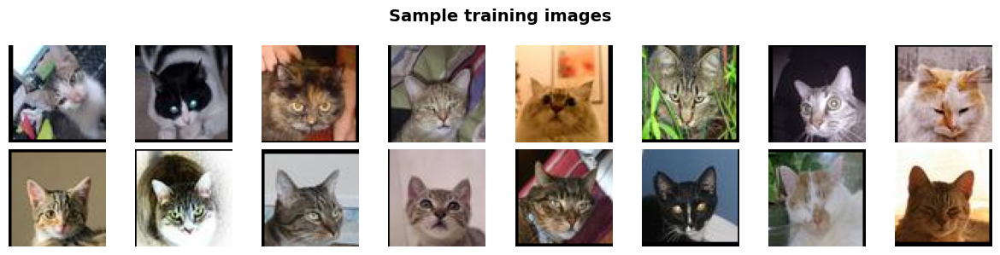

In [18]:
loader = get_dataloader(
    CONFIG["data_dir"],
    image_size=CONFIG["image_size"],
    batch_size=CONFIG["batch_size"],
    augment=True,
)

print(f"Images: {len(loader.dataset)}")
print(f"Batches/epoch: {len(loader)}")

batch = next(iter(loader))
plot_image_grid(batch[:16], title="Sample training images", nrow=8)

In [19]:
def train_one_seed(config, seed):
    """
    Full training run for one seed.
    Returns (model, result_dict).
    """
    set_seed(seed)
    seed_dir = Path(config["checkpoint_dir"]) / f"seed_{seed}"
    seed_dir.mkdir(parents=True, exist_ok=True)

    model = VAE(image_size=config["image_size"], latent_dim=config["latent_dim"],
        base_channels=config["base_channels"]).to(device)

    optimizer = optim.Adam(model.parameters(), lr=config["lr"])
    scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, patience=5, factor=0.5)

    history = {"total": [], "recon": [], "kl": []}
    best_loss = float("inf")

    for epoch in range(1, config["epochs"] + 1):
        model.train()
        total_loss = recon_loss_sum = kl_loss_sum = 0.0

        for batch in loader:
            x = batch.to(device)
            optimizer.zero_grad()
            recon, mu, log_var = model(x)
            loss, rl, kl = vae_loss(recon, x, mu, log_var, beta=config["beta"])
            loss.backward()
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimizer.step()

            total_loss += loss.item()
            recon_loss_sum += rl.item()
            kl_loss_sum += kl.item()

        n = len(loader)
        avg_total = total_loss / n
        avg_recon = recon_loss_sum / n
        avg_kl = kl_loss_sum / n

        history["total"].append(avg_total)
        history["recon"].append(avg_recon)
        history["kl"].append(avg_kl)

        scheduler.step(avg_total)

        print(f"  [seed={seed}] Epoch [{epoch:3d}/{config['epochs']}] "
              f"Loss: {avg_total:.4f} "
              f"(recon={avg_recon:.4f}, kl={avg_kl:.4f})")

        if avg_total < best_loss:
            best_loss = avg_total
            torch.save(model.state_dict(), seed_dir / "vae_best.pt")

        if epoch % config["sample_interval"] == 0:
            model.eval()
            with torch.no_grad():
                samples = model.generate(16, device)
            plot_image_grid(samples,
                title=f"Generated — seed {seed}, epoch {epoch}",
                save_path=str(seed_dir / f"samples_epoch_{epoch:03d}.png"))
            model.train()

    # load best checkpoint for evaluation
    model.load_state_dict(torch.load(seed_dir / "vae_best.pt"))

    # evaluate — universal generate_fn interface
    metrics = evaluate_model(
        generate_fn=lambda n: model.generate(n, device),
        real_loader=loader,
        device=device,
        n_samples=config["n_eval_samples"],
    )

    result = {
        "seed": seed,
        "history": history,
        "fid": metrics["fid"],
        "is_mean": metrics["is_mean"],
        "is_std": metrics["is_std"],
    }

    save_results(result, str(seed_dir / "result.json"))
    return model, result

In [21]:
def experiment_train_learning_rate(config):
    lr_results = {}
    lr_models = {}

    for lr in LR_VALUES:

        print("\n" + "=" * 70)
        print(f"Training VAE for lr = {lr}")
        print("=" * 70)

        config_lr = copy.deepcopy(config)

        config_lr["lr"] = lr

        lr_name = f"lr_{lr}"
        config_lr["checkpoint_dir"] = f"{config['checkpoint_dir']}/{lr_name}"

        Path(config_lr["checkpoint_dir"]).mkdir(parents=True, exist_ok=True)

        seed_results = {}
        seed_models = {}

        for seed in config_lr["seeds"]:

            print("\n" + "-" * 55)
            print(f"Training lr_={lr} seed={seed}")
            print("-" * 55)

            model, result = train_one_seed(config_lr, seed)

            result["lr"] = lr

            seed_results[seed] = result
            seed_models[seed] = model

        lr_results[lr] = seed_results
        lr_models[lr] = seed_models

        save_results(
            {
                "lr": lr,
                "results": seed_results,
            },
            f"{config_lr['checkpoint_dir']}/all_results.json",
        )

    return lr_results, lr_models


Training VAE for lr = 0.003

-------------------------------------------------------
Training lr_=0.003 seed=42
-------------------------------------------------------
  [seed=42] Epoch [  1/50] Loss: 0.4260 (recon=0.2515, kl=0.1745)
  [seed=42] Epoch [  2/50] Loss: 0.2409 (recon=0.1996, kl=0.0413)
  [seed=42] Epoch [  3/50] Loss: 0.2239 (recon=0.1846, kl=0.0393)
  [seed=42] Epoch [  4/50] Loss: 0.2174 (recon=0.1770, kl=0.0404)
  [seed=42] Epoch [  5/50] Loss: 0.2139 (recon=0.1724, kl=0.0416)
  [seed=42] Epoch [  6/50] Loss: 0.2110 (recon=0.1685, kl=0.0425)
  [seed=42] Epoch [  7/50] Loss: 0.2092 (recon=0.1659, kl=0.0432)
  [seed=42] Epoch [  8/50] Loss: 0.2077 (recon=0.1642, kl=0.0436)
  [seed=42] Epoch [  9/50] Loss: 0.2067 (recon=0.1630, kl=0.0437)
  [seed=42] Epoch [ 10/50] Loss: 0.2059 (recon=0.1623, kl=0.0436)


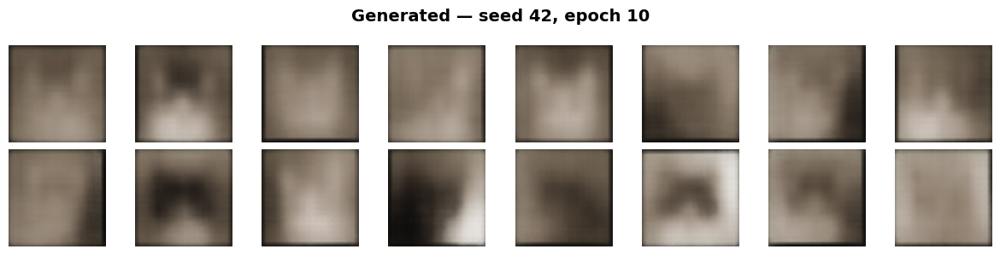

  [seed=42] Epoch [ 11/50] Loss: 0.2048 (recon=0.1609, kl=0.0439)
  [seed=42] Epoch [ 12/50] Loss: 0.2039 (recon=0.1600, kl=0.0439)
  [seed=42] Epoch [ 13/50] Loss: 0.2032 (recon=0.1597, kl=0.0436)
  [seed=42] Epoch [ 14/50] Loss: 0.2030 (recon=0.1592, kl=0.0439)
  [seed=42] Epoch [ 15/50] Loss: 0.2023 (recon=0.1584, kl=0.0439)
  [seed=42] Epoch [ 16/50] Loss: 0.2019 (recon=0.1576, kl=0.0443)
  [seed=42] Epoch [ 17/50] Loss: 0.2011 (recon=0.1565, kl=0.0446)
  [seed=42] Epoch [ 18/50] Loss: 0.2004 (recon=0.1557, kl=0.0447)
  [seed=42] Epoch [ 19/50] Loss: 0.2007 (recon=0.1558, kl=0.0449)
  [seed=42] Epoch [ 20/50] Loss: 0.2004 (recon=0.1555, kl=0.0449)


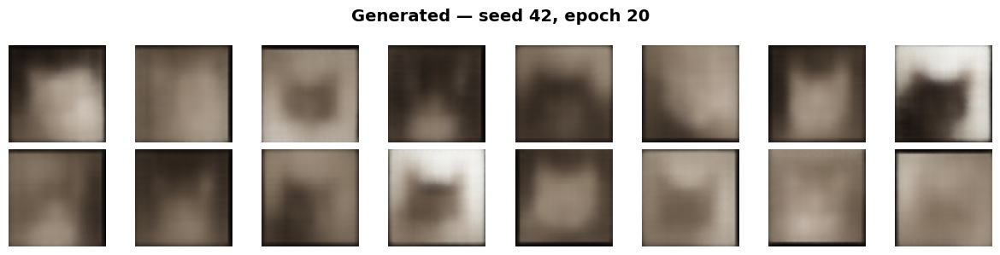

  [seed=42] Epoch [ 21/50] Loss: 0.2005 (recon=0.1551, kl=0.0455)
  [seed=42] Epoch [ 22/50] Loss: 0.2000 (recon=0.1550, kl=0.0451)
  [seed=42] Epoch [ 23/50] Loss: 0.1998 (recon=0.1545, kl=0.0453)
  [seed=42] Epoch [ 24/50] Loss: 0.1994 (recon=0.1540, kl=0.0454)
  [seed=42] Epoch [ 25/50] Loss: 0.1995 (recon=0.1543, kl=0.0452)
  [seed=42] Epoch [ 26/50] Loss: 0.1990 (recon=0.1534, kl=0.0455)
  [seed=42] Epoch [ 27/50] Loss: 0.1988 (recon=0.1532, kl=0.0457)
  [seed=42] Epoch [ 28/50] Loss: 0.1989 (recon=0.1530, kl=0.0459)
  [seed=42] Epoch [ 29/50] Loss: 0.1985 (recon=0.1528, kl=0.0457)
  [seed=42] Epoch [ 30/50] Loss: 0.1992 (recon=0.1531, kl=0.0462)


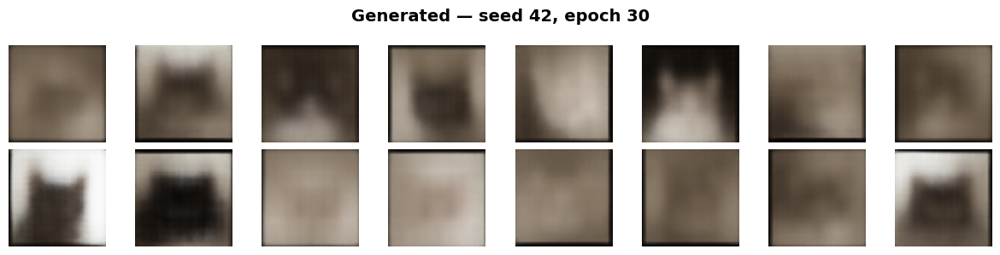

  [seed=42] Epoch [ 31/50] Loss: 0.1988 (recon=0.1526, kl=0.0461)
  [seed=42] Epoch [ 32/50] Loss: 0.1986 (recon=0.1523, kl=0.0463)
  [seed=42] Epoch [ 33/50] Loss: 0.1986 (recon=0.1522, kl=0.0464)
  [seed=42] Epoch [ 34/50] Loss: 0.1979 (recon=0.1515, kl=0.0465)
  [seed=42] Epoch [ 35/50] Loss: 0.1984 (recon=0.1515, kl=0.0470)
  [seed=42] Epoch [ 36/50] Loss: 0.1976 (recon=0.1511, kl=0.0465)
  [seed=42] Epoch [ 37/50] Loss: 0.1983 (recon=0.1514, kl=0.0469)
  [seed=42] Epoch [ 38/50] Loss: 0.1980 (recon=0.1513, kl=0.0467)
  [seed=42] Epoch [ 39/50] Loss: 0.1979 (recon=0.1515, kl=0.0464)
  [seed=42] Epoch [ 40/50] Loss: 0.1978 (recon=0.1509, kl=0.0469)


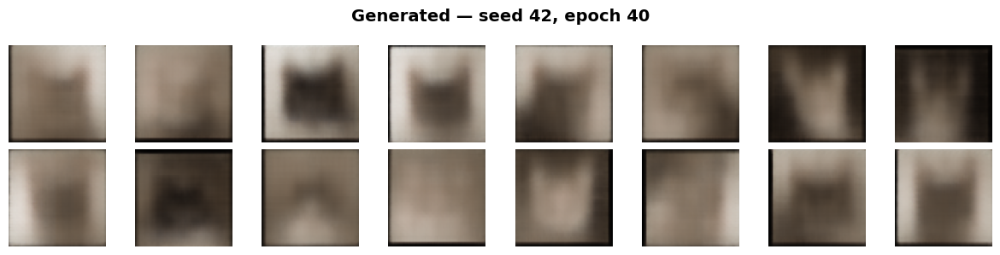

  [seed=42] Epoch [ 41/50] Loss: 0.1974 (recon=0.1508, kl=0.0466)
  [seed=42] Epoch [ 42/50] Loss: 0.1979 (recon=0.1510, kl=0.0469)
  [seed=42] Epoch [ 43/50] Loss: 0.1977 (recon=0.1509, kl=0.0468)
  [seed=42] Epoch [ 44/50] Loss: 0.1978 (recon=0.1508, kl=0.0470)
  [seed=42] Epoch [ 45/50] Loss: 0.1976 (recon=0.1504, kl=0.0472)
  [seed=42] Epoch [ 46/50] Loss: 0.1974 (recon=0.1506, kl=0.0468)
  [seed=42] Epoch [ 47/50] Loss: 0.1972 (recon=0.1503, kl=0.0468)
  [seed=42] Epoch [ 48/50] Loss: 0.1971 (recon=0.1503, kl=0.0468)
  [seed=42] Epoch [ 49/50] Loss: 0.1973 (recon=0.1504, kl=0.0468)
  [seed=42] Epoch [ 50/50] Loss: 0.1975 (recon=0.1503, kl=0.0472)


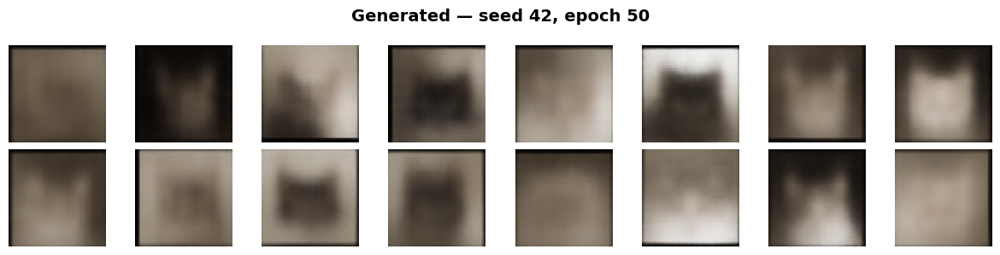

Evaluating with 1000 samples...


/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Inception_V3_Weights.IMAGENET1K_V1`. You can also use `weights=Inception_V3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/inception_v3_google-0cc3c7bd.pth" to /root/.cache/torch/hub/checkpoints/inception_v3_google-0cc3c7bd.pth


100%|██████████| 104M/104M [00:00<00:00, 168MB/s]  


  Extracting real image features...


  Real:  10%|▉         | 15/156 [00:00<00:08, 16.00it/s]


  Generating fake images...
  Computing FID...
  Computing Inception Score...

EVALUATION RESULTS
FID: 296.66  (lower is better)
Inception Score: 1.39 +/- 0.03  (higher is better)

-------------------------------------------------------
Training lr_=0.003 seed=123
-------------------------------------------------------
  [seed=123] Epoch [  1/50] Loss: 0.4642 (recon=0.2660, kl=0.1982)
  [seed=123] Epoch [  2/50] Loss: 0.2541 (recon=0.2105, kl=0.0435)
  [seed=123] Epoch [  3/50] Loss: 0.2378 (recon=0.1971, kl=0.0407)
  [seed=123] Epoch [  4/50] Loss: 0.2253 (recon=0.1882, kl=0.0371)
  [seed=123] Epoch [  5/50] Loss: 0.2184 (recon=0.1802, kl=0.0382)
  [seed=123] Epoch [  6/50] Loss: 0.2149 (recon=0.1741, kl=0.0409)
  [seed=123] Epoch [  7/50] Loss: 0.2114 (recon=0.1698, kl=0.0416)
  [seed=123] Epoch [  8/50] Loss: 0.2096 (recon=0.1672, kl=0.0424)
  [seed=123] Epoch [  9/50] Loss: 0.2078 (recon=0.1650, kl=0.0428)
  [seed=123] Epoch [ 10/50] Loss: 0.2068 (recon=0.1641, kl=0.0427)


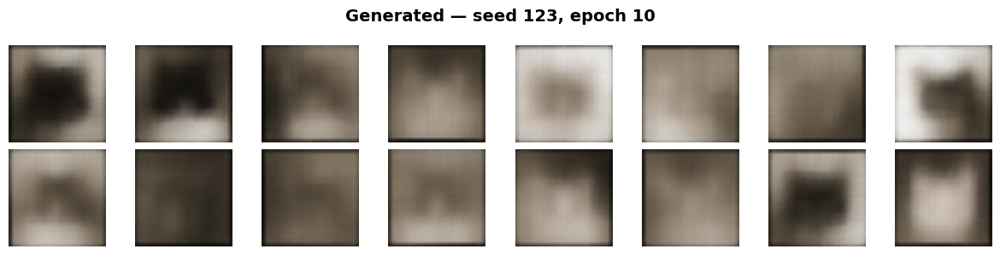

  [seed=123] Epoch [ 11/50] Loss: 0.2055 (recon=0.1625, kl=0.0430)
  [seed=123] Epoch [ 12/50] Loss: 0.2052 (recon=0.1625, kl=0.0427)
  [seed=123] Epoch [ 13/50] Loss: 0.2043 (recon=0.1616, kl=0.0427)
  [seed=123] Epoch [ 14/50] Loss: 0.2033 (recon=0.1602, kl=0.0431)
  [seed=123] Epoch [ 15/50] Loss: 0.2030 (recon=0.1597, kl=0.0434)
  [seed=123] Epoch [ 16/50] Loss: 0.2020 (recon=0.1581, kl=0.0439)
  [seed=123] Epoch [ 17/50] Loss: 0.2014 (recon=0.1570, kl=0.0444)
  [seed=123] Epoch [ 18/50] Loss: 0.2006 (recon=0.1561, kl=0.0444)
  [seed=123] Epoch [ 19/50] Loss: 0.2002 (recon=0.1554, kl=0.0448)
  [seed=123] Epoch [ 20/50] Loss: 0.2001 (recon=0.1550, kl=0.0451)


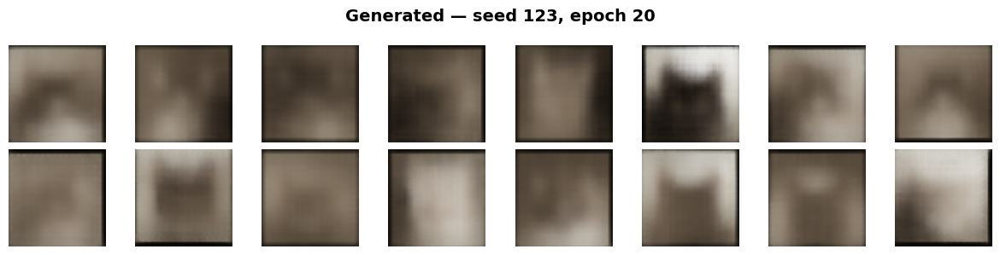

  [seed=123] Epoch [ 21/50] Loss: 0.2000 (recon=0.1554, kl=0.0447)
  [seed=123] Epoch [ 22/50] Loss: 0.1998 (recon=0.1545, kl=0.0453)
  [seed=123] Epoch [ 23/50] Loss: 0.1998 (recon=0.1547, kl=0.0451)
  [seed=123] Epoch [ 24/50] Loss: 0.1992 (recon=0.1538, kl=0.0454)
  [seed=123] Epoch [ 25/50] Loss: 0.1992 (recon=0.1540, kl=0.0452)
  [seed=123] Epoch [ 26/50] Loss: 0.1995 (recon=0.1542, kl=0.0454)
  [seed=123] Epoch [ 27/50] Loss: 0.1991 (recon=0.1537, kl=0.0453)
  [seed=123] Epoch [ 28/50] Loss: 0.1995 (recon=0.1539, kl=0.0457)
  [seed=123] Epoch [ 29/50] Loss: 0.1990 (recon=0.1535, kl=0.0455)
  [seed=123] Epoch [ 30/50] Loss: 0.1988 (recon=0.1532, kl=0.0456)


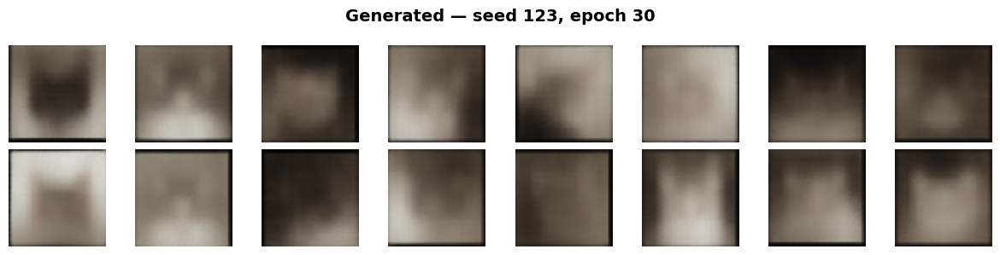

  [seed=123] Epoch [ 31/50] Loss: 0.1988 (recon=0.1529, kl=0.0459)
  [seed=123] Epoch [ 32/50] Loss: 0.1984 (recon=0.1528, kl=0.0456)
  [seed=123] Epoch [ 33/50] Loss: 0.1986 (recon=0.1532, kl=0.0453)
  [seed=123] Epoch [ 34/50] Loss: 0.1989 (recon=0.1531, kl=0.0459)
  [seed=123] Epoch [ 35/50] Loss: 0.1985 (recon=0.1528, kl=0.0457)
  [seed=123] Epoch [ 36/50] Loss: 0.1991 (recon=0.1530, kl=0.0462)
  [seed=123] Epoch [ 37/50] Loss: 0.1984 (recon=0.1525, kl=0.0460)
  [seed=123] Epoch [ 38/50] Loss: 0.1985 (recon=0.1522, kl=0.0463)
  [seed=123] Epoch [ 39/50] Loss: 0.1971 (recon=0.1512, kl=0.0459)
  [seed=123] Epoch [ 40/50] Loss: 0.1973 (recon=0.1509, kl=0.0463)


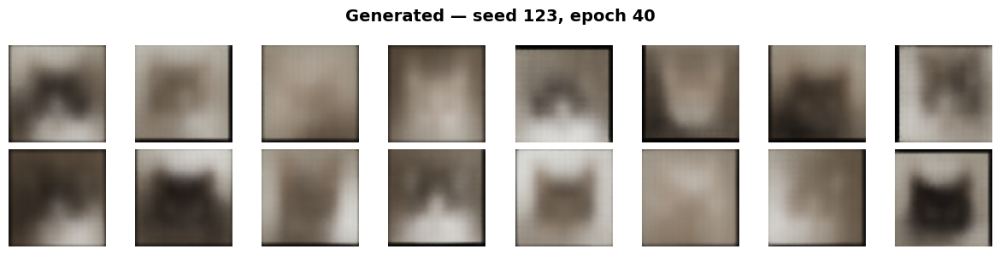

  [seed=123] Epoch [ 41/50] Loss: 0.1972 (recon=0.1505, kl=0.0467)
  [seed=123] Epoch [ 42/50] Loss: 0.1968 (recon=0.1503, kl=0.0465)
  [seed=123] Epoch [ 43/50] Loss: 0.1970 (recon=0.1505, kl=0.0465)
  [seed=123] Epoch [ 44/50] Loss: 0.1965 (recon=0.1499, kl=0.0466)
  [seed=123] Epoch [ 45/50] Loss: 0.1965 (recon=0.1499, kl=0.0466)
  [seed=123] Epoch [ 46/50] Loss: 0.1966 (recon=0.1497, kl=0.0469)
  [seed=123] Epoch [ 47/50] Loss: 0.1964 (recon=0.1498, kl=0.0467)
  [seed=123] Epoch [ 48/50] Loss: 0.1966 (recon=0.1496, kl=0.0470)
  [seed=123] Epoch [ 49/50] Loss: 0.1967 (recon=0.1497, kl=0.0471)
  [seed=123] Epoch [ 50/50] Loss: 0.1966 (recon=0.1495, kl=0.0471)


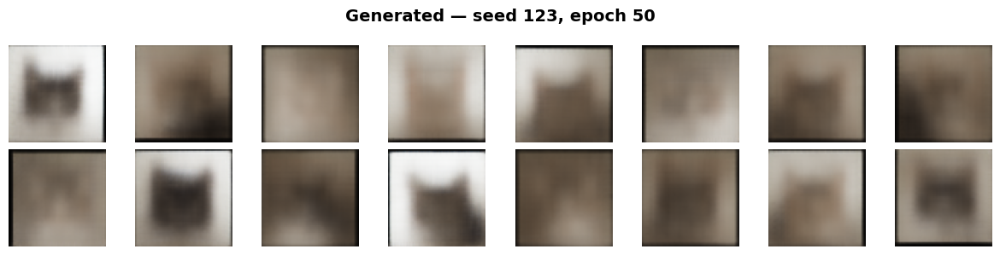

Evaluating with 1000 samples...
  Extracting real image features...


  Real:  10%|▉         | 15/156 [00:00<00:09, 15.27it/s]


  Generating fake images...
  Computing FID...
  Computing Inception Score...

EVALUATION RESULTS
FID: 297.72  (lower is better)
Inception Score: 1.42 +/- 0.03  (higher is better)

-------------------------------------------------------
Training lr_=0.003 seed=456
-------------------------------------------------------
  [seed=456] Epoch [  1/50] Loss: 0.5126 (recon=0.2636, kl=0.2490)
  [seed=456] Epoch [  2/50] Loss: 0.2519 (recon=0.2080, kl=0.0439)
  [seed=456] Epoch [  3/50] Loss: 0.2310 (recon=0.1916, kl=0.0395)
  [seed=456] Epoch [  4/50] Loss: 0.2199 (recon=0.1811, kl=0.0388)
  [seed=456] Epoch [  5/50] Loss: 0.2171 (recon=0.1779, kl=0.0392)
  [seed=456] Epoch [  6/50] Loss: 0.2148 (recon=0.1743, kl=0.0405)
  [seed=456] Epoch [  7/50] Loss: 0.2127 (recon=0.1711, kl=0.0415)
  [seed=456] Epoch [  8/50] Loss: 0.2103 (recon=0.1682, kl=0.0422)
  [seed=456] Epoch [  9/50] Loss: 0.2090 (recon=0.1663, kl=0.0427)
  [seed=456] Epoch [ 10/50] Loss: 0.2068 (recon=0.1638, kl=0.0429)


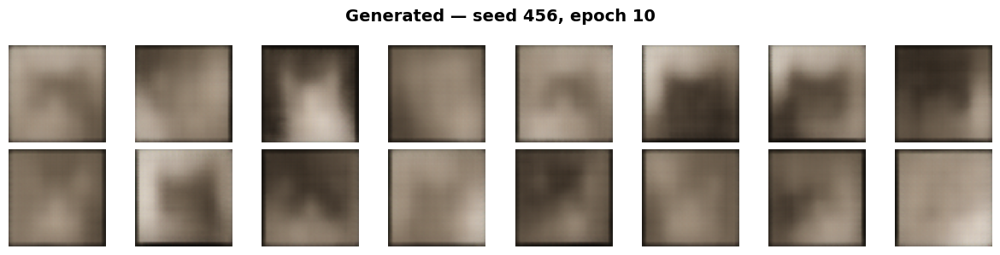

  [seed=456] Epoch [ 11/50] Loss: 0.2061 (recon=0.1633, kl=0.0428)
  [seed=456] Epoch [ 12/50] Loss: 0.2047 (recon=0.1616, kl=0.0431)
  [seed=456] Epoch [ 13/50] Loss: 0.2045 (recon=0.1612, kl=0.0432)
  [seed=456] Epoch [ 14/50] Loss: 0.2037 (recon=0.1604, kl=0.0433)
  [seed=456] Epoch [ 15/50] Loss: 0.2032 (recon=0.1602, kl=0.0431)
  [seed=456] Epoch [ 16/50] Loss: 0.2026 (recon=0.1592, kl=0.0434)
  [seed=456] Epoch [ 17/50] Loss: 0.2019 (recon=0.1584, kl=0.0436)
  [seed=456] Epoch [ 18/50] Loss: 0.2022 (recon=0.1586, kl=0.0436)
  [seed=456] Epoch [ 19/50] Loss: 0.2017 (recon=0.1579, kl=0.0438)
  [seed=456] Epoch [ 20/50] Loss: 0.2019 (recon=0.1580, kl=0.0439)


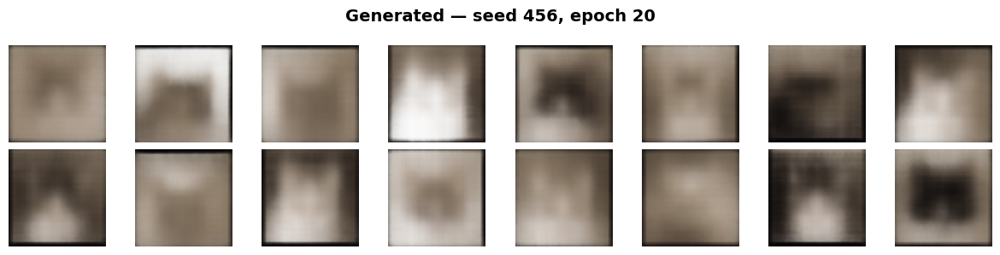

  [seed=456] Epoch [ 21/50] Loss: 0.2014 (recon=0.1572, kl=0.0442)
  [seed=456] Epoch [ 22/50] Loss: 0.2011 (recon=0.1568, kl=0.0443)
  [seed=456] Epoch [ 23/50] Loss: 0.2009 (recon=0.1563, kl=0.0446)
  [seed=456] Epoch [ 24/50] Loss: 0.2007 (recon=0.1558, kl=0.0449)
  [seed=456] Epoch [ 25/50] Loss: 0.2000 (recon=0.1549, kl=0.0451)
  [seed=456] Epoch [ 26/50] Loss: 0.1997 (recon=0.1542, kl=0.0455)
  [seed=456] Epoch [ 27/50] Loss: 0.1994 (recon=0.1542, kl=0.0451)
  [seed=456] Epoch [ 28/50] Loss: 0.1995 (recon=0.1541, kl=0.0454)
  [seed=456] Epoch [ 29/50] Loss: 0.1996 (recon=0.1538, kl=0.0457)
  [seed=456] Epoch [ 30/50] Loss: 0.1992 (recon=0.1535, kl=0.0458)


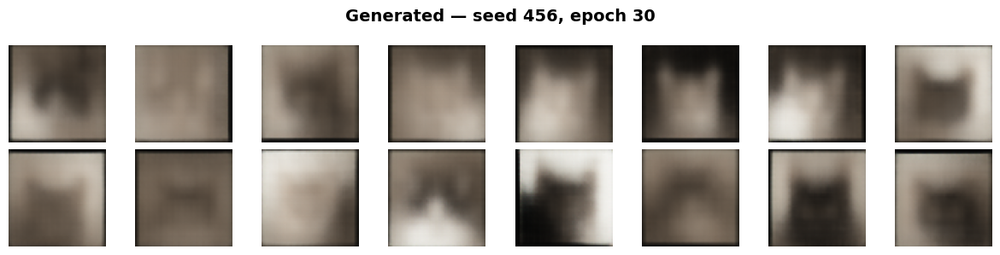

  [seed=456] Epoch [ 31/50] Loss: 0.1991 (recon=0.1535, kl=0.0456)
  [seed=456] Epoch [ 32/50] Loss: 0.1993 (recon=0.1535, kl=0.0458)
  [seed=456] Epoch [ 33/50] Loss: 0.1993 (recon=0.1538, kl=0.0455)
  [seed=456] Epoch [ 34/50] Loss: 0.1991 (recon=0.1534, kl=0.0457)
  [seed=456] Epoch [ 35/50] Loss: 0.1987 (recon=0.1530, kl=0.0457)
  [seed=456] Epoch [ 36/50] Loss: 0.1984 (recon=0.1525, kl=0.0459)
  [seed=456] Epoch [ 37/50] Loss: 0.1988 (recon=0.1525, kl=0.0462)
  [seed=456] Epoch [ 38/50] Loss: 0.1987 (recon=0.1526, kl=0.0461)
  [seed=456] Epoch [ 39/50] Loss: 0.1986 (recon=0.1524, kl=0.0462)
  [seed=456] Epoch [ 40/50] Loss: 0.1984 (recon=0.1523, kl=0.0461)


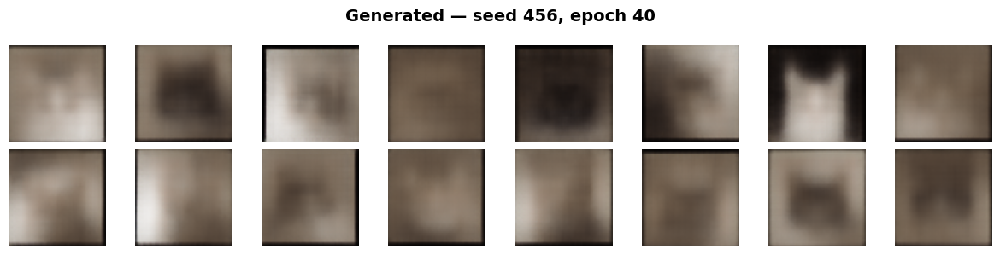

  [seed=456] Epoch [ 41/50] Loss: 0.1985 (recon=0.1522, kl=0.0463)
  [seed=456] Epoch [ 42/50] Loss: 0.1983 (recon=0.1518, kl=0.0464)
  [seed=456] Epoch [ 43/50] Loss: 0.1984 (recon=0.1517, kl=0.0467)
  [seed=456] Epoch [ 44/50] Loss: 0.1980 (recon=0.1514, kl=0.0466)
  [seed=456] Epoch [ 45/50] Loss: 0.1982 (recon=0.1514, kl=0.0468)
  [seed=456] Epoch [ 46/50] Loss: 0.1980 (recon=0.1510, kl=0.0470)
  [seed=456] Epoch [ 47/50] Loss: 0.1981 (recon=0.1511, kl=0.0471)
  [seed=456] Epoch [ 48/50] Loss: 0.1978 (recon=0.1508, kl=0.0469)
  [seed=456] Epoch [ 49/50] Loss: 0.1978 (recon=0.1507, kl=0.0471)
  [seed=456] Epoch [ 50/50] Loss: 0.1983 (recon=0.1508, kl=0.0475)


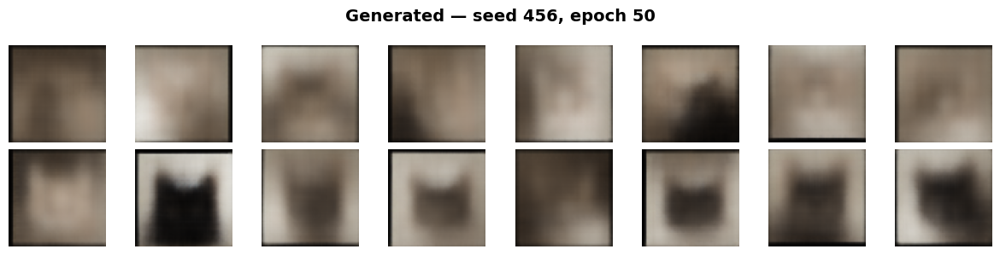

Evaluating with 1000 samples...
  Extracting real image features...


  Real:  10%|▉         | 15/156 [00:01<00:09, 14.73it/s]


  Generating fake images...
  Computing FID...
  Computing Inception Score...

EVALUATION RESULTS
FID: 297.51  (lower is better)
Inception Score: 1.39 +/- 0.02  (higher is better)

Training VAE for lr = 0.001

-------------------------------------------------------
Training lr_=0.001 seed=42
-------------------------------------------------------
  [seed=42] Epoch [  1/50] Loss: 0.3005 (recon=0.2527, kl=0.0478)
  [seed=42] Epoch [  2/50] Loss: 0.2354 (recon=0.1959, kl=0.0395)
  [seed=42] Epoch [  3/50] Loss: 0.2224 (recon=0.1836, kl=0.0389)
  [seed=42] Epoch [  4/50] Loss: 0.2188 (recon=0.1795, kl=0.0393)
  [seed=42] Epoch [  5/50] Loss: 0.2159 (recon=0.1758, kl=0.0401)
  [seed=42] Epoch [  6/50] Loss: 0.2134 (recon=0.1728, kl=0.0406)
  [seed=42] Epoch [  7/50] Loss: 0.2119 (recon=0.1707, kl=0.0412)
  [seed=42] Epoch [  8/50] Loss: 0.2110 (recon=0.1694, kl=0.0416)
  [seed=42] Epoch [  9/50] Loss: 0.2103 (recon=0.1688, kl=0.0415)
  [seed=42] Epoch [ 10/50] Loss: 0.2094 (recon=0.1679, kl

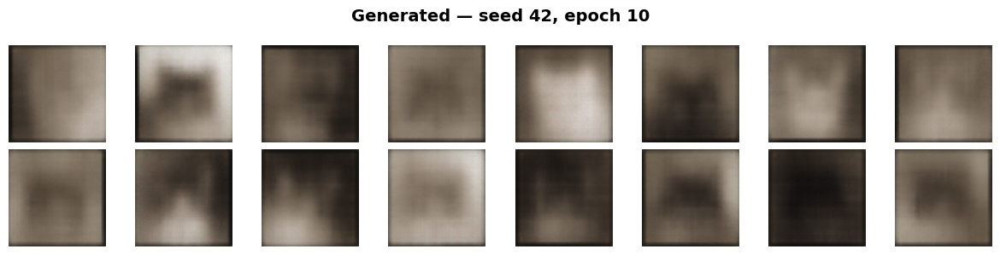

  [seed=42] Epoch [ 11/50] Loss: 0.2093 (recon=0.1673, kl=0.0420)
  [seed=42] Epoch [ 12/50] Loss: 0.2078 (recon=0.1655, kl=0.0423)
  [seed=42] Epoch [ 13/50] Loss: 0.2065 (recon=0.1636, kl=0.0428)
  [seed=42] Epoch [ 14/50] Loss: 0.2060 (recon=0.1621, kl=0.0438)
  [seed=42] Epoch [ 15/50] Loss: 0.2052 (recon=0.1611, kl=0.0440)
  [seed=42] Epoch [ 16/50] Loss: 0.2042 (recon=0.1599, kl=0.0442)
  [seed=42] Epoch [ 17/50] Loss: 0.2037 (recon=0.1592, kl=0.0445)
  [seed=42] Epoch [ 18/50] Loss: 0.2031 (recon=0.1584, kl=0.0447)
  [seed=42] Epoch [ 19/50] Loss: 0.2025 (recon=0.1576, kl=0.0450)
  [seed=42] Epoch [ 20/50] Loss: 0.2021 (recon=0.1571, kl=0.0450)


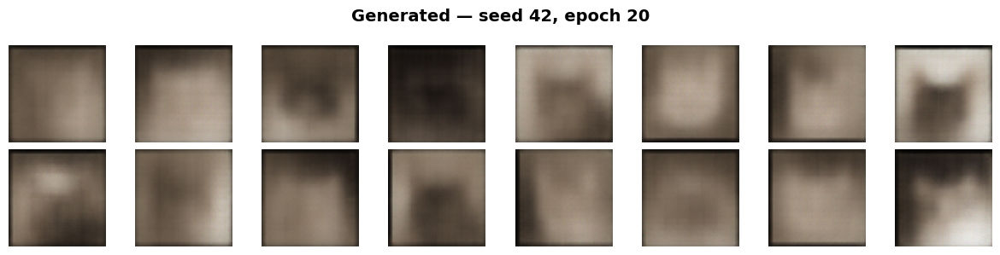

  [seed=42] Epoch [ 21/50] Loss: 0.2019 (recon=0.1568, kl=0.0451)
  [seed=42] Epoch [ 22/50] Loss: 0.2019 (recon=0.1565, kl=0.0454)
  [seed=42] Epoch [ 23/50] Loss: 0.2014 (recon=0.1561, kl=0.0453)
  [seed=42] Epoch [ 24/50] Loss: 0.2009 (recon=0.1554, kl=0.0455)
  [seed=42] Epoch [ 25/50] Loss: 0.2011 (recon=0.1558, kl=0.0454)
  [seed=42] Epoch [ 26/50] Loss: 0.2006 (recon=0.1553, kl=0.0453)
  [seed=42] Epoch [ 27/50] Loss: 0.2003 (recon=0.1548, kl=0.0455)
  [seed=42] Epoch [ 28/50] Loss: 0.2003 (recon=0.1548, kl=0.0456)
  [seed=42] Epoch [ 29/50] Loss: 0.2002 (recon=0.1546, kl=0.0456)
  [seed=42] Epoch [ 30/50] Loss: 0.2004 (recon=0.1547, kl=0.0457)


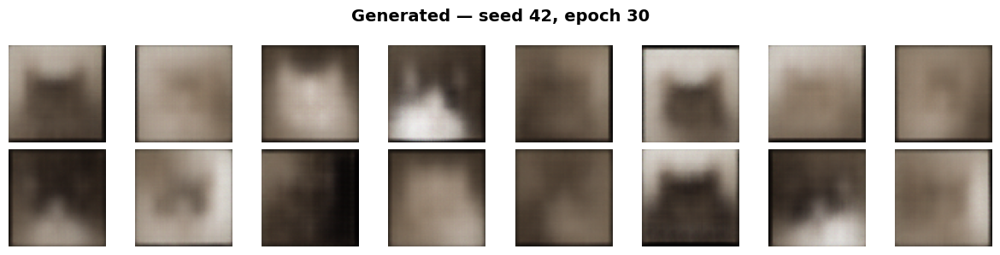

  [seed=42] Epoch [ 31/50] Loss: 0.1999 (recon=0.1545, kl=0.0454)
  [seed=42] Epoch [ 32/50] Loss: 0.1997 (recon=0.1541, kl=0.0456)
  [seed=42] Epoch [ 33/50] Loss: 0.2002 (recon=0.1544, kl=0.0458)
  [seed=42] Epoch [ 34/50] Loss: 0.1996 (recon=0.1535, kl=0.0461)
  [seed=42] Epoch [ 35/50] Loss: 0.1992 (recon=0.1534, kl=0.0458)
  [seed=42] Epoch [ 36/50] Loss: 0.1989 (recon=0.1532, kl=0.0456)
  [seed=42] Epoch [ 37/50] Loss: 0.1995 (recon=0.1536, kl=0.0459)
  [seed=42] Epoch [ 38/50] Loss: 0.1991 (recon=0.1532, kl=0.0459)
  [seed=42] Epoch [ 39/50] Loss: 0.1995 (recon=0.1536, kl=0.0459)
  [seed=42] Epoch [ 40/50] Loss: 0.1992 (recon=0.1531, kl=0.0461)


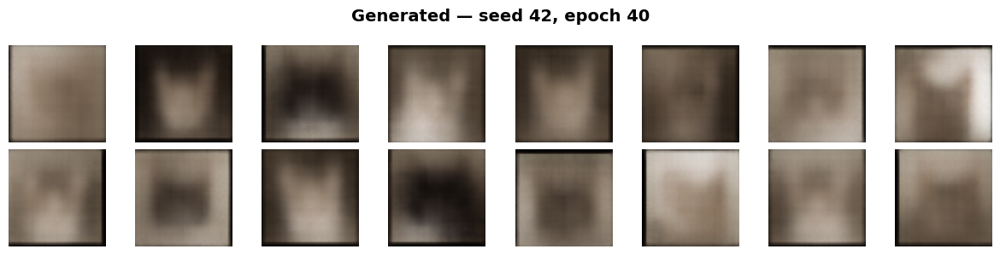

  [seed=42] Epoch [ 41/50] Loss: 0.1987 (recon=0.1527, kl=0.0460)
  [seed=42] Epoch [ 42/50] Loss: 0.1990 (recon=0.1530, kl=0.0460)
  [seed=42] Epoch [ 43/50] Loss: 0.1985 (recon=0.1525, kl=0.0461)
  [seed=42] Epoch [ 44/50] Loss: 0.1985 (recon=0.1524, kl=0.0460)
  [seed=42] Epoch [ 45/50] Loss: 0.1984 (recon=0.1521, kl=0.0464)
  [seed=42] Epoch [ 46/50] Loss: 0.1981 (recon=0.1520, kl=0.0461)
  [seed=42] Epoch [ 47/50] Loss: 0.1981 (recon=0.1520, kl=0.0461)
  [seed=42] Epoch [ 48/50] Loss: 0.1980 (recon=0.1517, kl=0.0462)
  [seed=42] Epoch [ 49/50] Loss: 0.1979 (recon=0.1514, kl=0.0464)
  [seed=42] Epoch [ 50/50] Loss: 0.1980 (recon=0.1511, kl=0.0469)


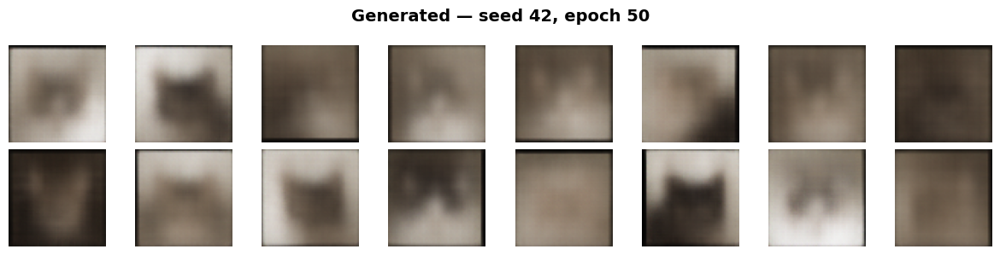

Evaluating with 1000 samples...
  Extracting real image features...


  Real:  10%|▉         | 15/156 [00:00<00:09, 15.01it/s]


  Generating fake images...
  Computing FID...
  Computing Inception Score...

EVALUATION RESULTS
FID: 273.94  (lower is better)
Inception Score: 1.42 +/- 0.03  (higher is better)

-------------------------------------------------------
Training lr_=0.001 seed=123
-------------------------------------------------------
  [seed=123] Epoch [  1/50] Loss: 0.2875 (recon=0.2394, kl=0.0481)
  [seed=123] Epoch [  2/50] Loss: 0.2399 (recon=0.2002, kl=0.0396)
  [seed=123] Epoch [  3/50] Loss: 0.2233 (recon=0.1847, kl=0.0386)
  [seed=123] Epoch [  4/50] Loss: 0.2164 (recon=0.1775, kl=0.0389)
  [seed=123] Epoch [  5/50] Loss: 0.2144 (recon=0.1741, kl=0.0403)
  [seed=123] Epoch [  6/50] Loss: 0.2135 (recon=0.1721, kl=0.0415)
  [seed=123] Epoch [  7/50] Loss: 0.2121 (recon=0.1699, kl=0.0422)
  [seed=123] Epoch [  8/50] Loss: 0.2103 (recon=0.1676, kl=0.0427)
  [seed=123] Epoch [  9/50] Loss: 0.2088 (recon=0.1662, kl=0.0426)
  [seed=123] Epoch [ 10/50] Loss: 0.2087 (recon=0.1659, kl=0.0428)


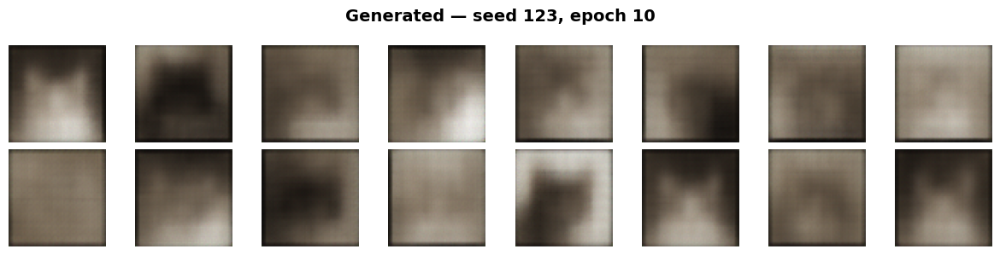

  [seed=123] Epoch [ 11/50] Loss: 0.2071 (recon=0.1642, kl=0.0429)
  [seed=123] Epoch [ 12/50] Loss: 0.2075 (recon=0.1649, kl=0.0425)
  [seed=123] Epoch [ 13/50] Loss: 0.2062 (recon=0.1637, kl=0.0425)
  [seed=123] Epoch [ 14/50] Loss: 0.2057 (recon=0.1629, kl=0.0427)
  [seed=123] Epoch [ 15/50] Loss: 0.2049 (recon=0.1619, kl=0.0430)
  [seed=123] Epoch [ 16/50] Loss: 0.2043 (recon=0.1607, kl=0.0437)
  [seed=123] Epoch [ 17/50] Loss: 0.2033 (recon=0.1594, kl=0.0439)
  [seed=123] Epoch [ 18/50] Loss: 0.2022 (recon=0.1576, kl=0.0446)
  [seed=123] Epoch [ 19/50] Loss: 0.2017 (recon=0.1567, kl=0.0450)
  [seed=123] Epoch [ 20/50] Loss: 0.2013 (recon=0.1559, kl=0.0454)


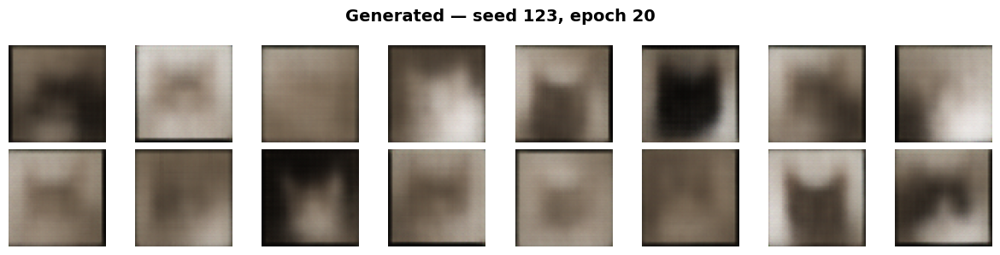

  [seed=123] Epoch [ 21/50] Loss: 0.2010 (recon=0.1557, kl=0.0453)
  [seed=123] Epoch [ 22/50] Loss: 0.2006 (recon=0.1546, kl=0.0461)
  [seed=123] Epoch [ 23/50] Loss: 0.2002 (recon=0.1543, kl=0.0459)
  [seed=123] Epoch [ 24/50] Loss: 0.1996 (recon=0.1532, kl=0.0464)
  [seed=123] Epoch [ 25/50] Loss: 0.1996 (recon=0.1531, kl=0.0465)
  [seed=123] Epoch [ 26/50] Loss: 0.1999 (recon=0.1535, kl=0.0464)
  [seed=123] Epoch [ 27/50] Loss: 0.1993 (recon=0.1528, kl=0.0465)
  [seed=123] Epoch [ 28/50] Loss: 0.1992 (recon=0.1528, kl=0.0465)
  [seed=123] Epoch [ 29/50] Loss: 0.1991 (recon=0.1524, kl=0.0467)
  [seed=123] Epoch [ 30/50] Loss: 0.1984 (recon=0.1519, kl=0.0466)


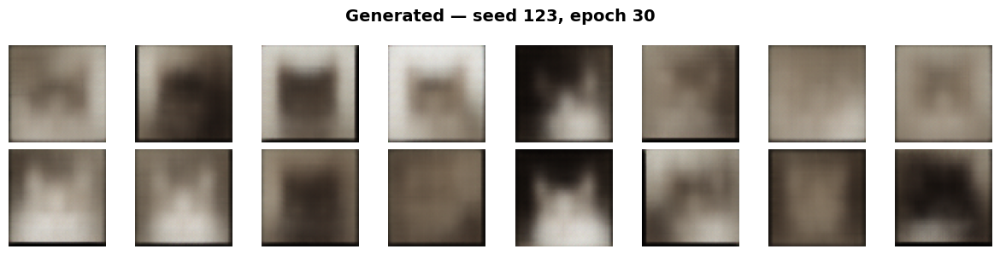

  [seed=123] Epoch [ 31/50] Loss: 0.1985 (recon=0.1519, kl=0.0466)
  [seed=123] Epoch [ 32/50] Loss: 0.1986 (recon=0.1516, kl=0.0470)
  [seed=123] Epoch [ 33/50] Loss: 0.1981 (recon=0.1519, kl=0.0462)
  [seed=123] Epoch [ 34/50] Loss: 0.1990 (recon=0.1521, kl=0.0469)
  [seed=123] Epoch [ 35/50] Loss: 0.1981 (recon=0.1514, kl=0.0467)
  [seed=123] Epoch [ 36/50] Loss: 0.1986 (recon=0.1520, kl=0.0466)
  [seed=123] Epoch [ 37/50] Loss: 0.1982 (recon=0.1514, kl=0.0468)
  [seed=123] Epoch [ 38/50] Loss: 0.1980 (recon=0.1511, kl=0.0469)
  [seed=123] Epoch [ 39/50] Loss: 0.1977 (recon=0.1511, kl=0.0466)
  [seed=123] Epoch [ 40/50] Loss: 0.1981 (recon=0.1511, kl=0.0470)


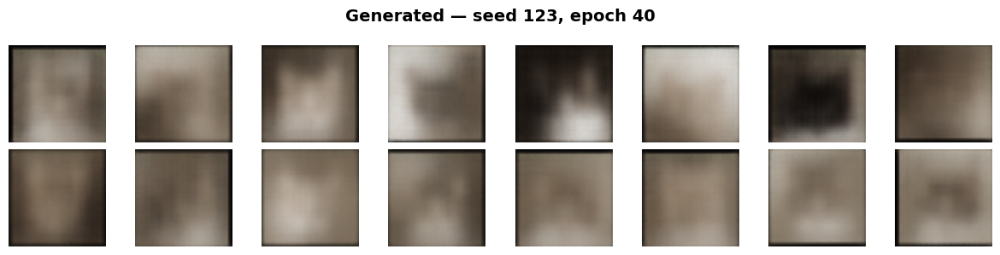

  [seed=123] Epoch [ 41/50] Loss: 0.1979 (recon=0.1509, kl=0.0471)
  [seed=123] Epoch [ 42/50] Loss: 0.1978 (recon=0.1508, kl=0.0471)
  [seed=123] Epoch [ 43/50] Loss: 0.1980 (recon=0.1508, kl=0.0472)
  [seed=123] Epoch [ 44/50] Loss: 0.1977 (recon=0.1506, kl=0.0470)
  [seed=123] Epoch [ 45/50] Loss: 0.1975 (recon=0.1505, kl=0.0470)
  [seed=123] Epoch [ 46/50] Loss: 0.1975 (recon=0.1504, kl=0.0471)
  [seed=123] Epoch [ 47/50] Loss: 0.1976 (recon=0.1506, kl=0.0469)
  [seed=123] Epoch [ 48/50] Loss: 0.1975 (recon=0.1504, kl=0.0471)
  [seed=123] Epoch [ 49/50] Loss: 0.1976 (recon=0.1502, kl=0.0474)
  [seed=123] Epoch [ 50/50] Loss: 0.1973 (recon=0.1501, kl=0.0473)


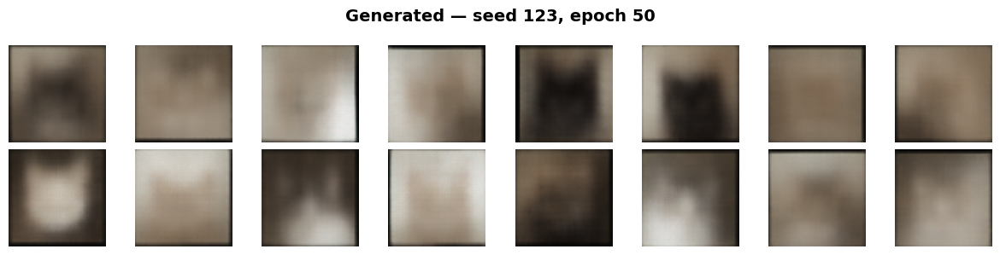

Evaluating with 1000 samples...
  Extracting real image features...


  Real:  10%|▉         | 15/156 [00:00<00:08, 16.08it/s]


  Generating fake images...
  Computing FID...
  Computing Inception Score...

EVALUATION RESULTS
FID: 273.38  (lower is better)
Inception Score: 1.44 +/- 0.03  (higher is better)

-------------------------------------------------------
Training lr_=0.001 seed=456
-------------------------------------------------------
  [seed=456] Epoch [  1/50] Loss: 0.2911 (recon=0.2458, kl=0.0453)
  [seed=456] Epoch [  2/50] Loss: 0.2436 (recon=0.2034, kl=0.0402)
  [seed=456] Epoch [  3/50] Loss: 0.2244 (recon=0.1860, kl=0.0384)
  [seed=456] Epoch [  4/50] Loss: 0.2191 (recon=0.1800, kl=0.0392)
  [seed=456] Epoch [  5/50] Loss: 0.2164 (recon=0.1760, kl=0.0404)
  [seed=456] Epoch [  6/50] Loss: 0.2137 (recon=0.1725, kl=0.0412)
  [seed=456] Epoch [  7/50] Loss: 0.2127 (recon=0.1709, kl=0.0418)
  [seed=456] Epoch [  8/50] Loss: 0.2114 (recon=0.1691, kl=0.0423)
  [seed=456] Epoch [  9/50] Loss: 0.2109 (recon=0.1683, kl=0.0426)
  [seed=456] Epoch [ 10/50] Loss: 0.2087 (recon=0.1663, kl=0.0424)


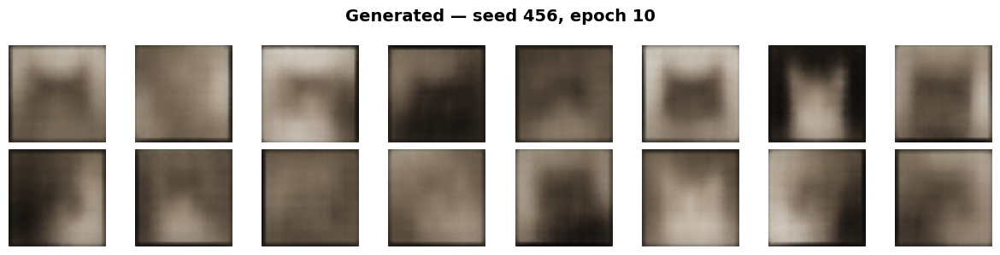

  [seed=456] Epoch [ 11/50] Loss: 0.2085 (recon=0.1662, kl=0.0424)
  [seed=456] Epoch [ 12/50] Loss: 0.2072 (recon=0.1644, kl=0.0428)
  [seed=456] Epoch [ 13/50] Loss: 0.2065 (recon=0.1630, kl=0.0434)
  [seed=456] Epoch [ 14/50] Loss: 0.2058 (recon=0.1622, kl=0.0436)
  [seed=456] Epoch [ 15/50] Loss: 0.2053 (recon=0.1619, kl=0.0434)
  [seed=456] Epoch [ 16/50] Loss: 0.2047 (recon=0.1614, kl=0.0433)
  [seed=456] Epoch [ 17/50] Loss: 0.2037 (recon=0.1598, kl=0.0439)
  [seed=456] Epoch [ 18/50] Loss: 0.2033 (recon=0.1593, kl=0.0440)
  [seed=456] Epoch [ 19/50] Loss: 0.2030 (recon=0.1582, kl=0.0447)
  [seed=456] Epoch [ 20/50] Loss: 0.2023 (recon=0.1573, kl=0.0450)


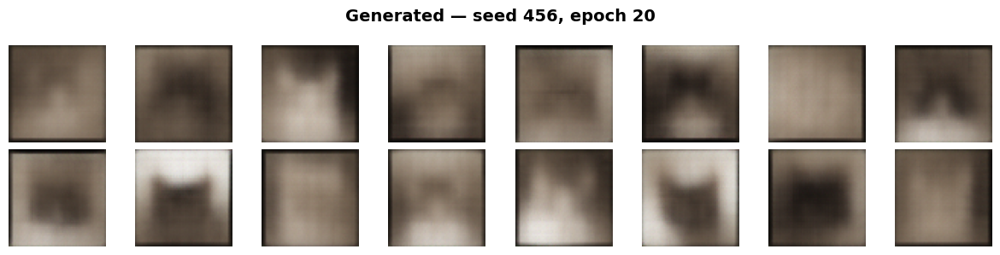

  [seed=456] Epoch [ 21/50] Loss: 0.2015 (recon=0.1556, kl=0.0459)
  [seed=456] Epoch [ 22/50] Loss: 0.2008 (recon=0.1550, kl=0.0458)
  [seed=456] Epoch [ 23/50] Loss: 0.2005 (recon=0.1546, kl=0.0459)
  [seed=456] Epoch [ 24/50] Loss: 0.2003 (recon=0.1542, kl=0.0461)
  [seed=456] Epoch [ 25/50] Loss: 0.1999 (recon=0.1538, kl=0.0461)
  [seed=456] Epoch [ 26/50] Loss: 0.1998 (recon=0.1532, kl=0.0465)
  [seed=456] Epoch [ 27/50] Loss: 0.1997 (recon=0.1534, kl=0.0462)
  [seed=456] Epoch [ 28/50] Loss: 0.1994 (recon=0.1529, kl=0.0464)
  [seed=456] Epoch [ 29/50] Loss: 0.1992 (recon=0.1528, kl=0.0463)
  [seed=456] Epoch [ 30/50] Loss: 0.1988 (recon=0.1524, kl=0.0465)


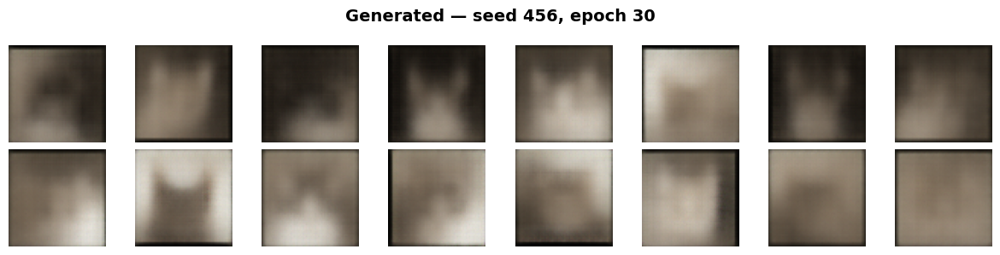

  [seed=456] Epoch [ 31/50] Loss: 0.1987 (recon=0.1524, kl=0.0463)
  [seed=456] Epoch [ 32/50] Loss: 0.1990 (recon=0.1523, kl=0.0468)
  [seed=456] Epoch [ 33/50] Loss: 0.1993 (recon=0.1526, kl=0.0466)
  [seed=456] Epoch [ 34/50] Loss: 0.1986 (recon=0.1521, kl=0.0465)
  [seed=456] Epoch [ 35/50] Loss: 0.1986 (recon=0.1518, kl=0.0467)
  [seed=456] Epoch [ 36/50] Loss: 0.1982 (recon=0.1517, kl=0.0465)
  [seed=456] Epoch [ 37/50] Loss: 0.1986 (recon=0.1518, kl=0.0467)
  [seed=456] Epoch [ 38/50] Loss: 0.1987 (recon=0.1519, kl=0.0468)
  [seed=456] Epoch [ 39/50] Loss: 0.1982 (recon=0.1514, kl=0.0468)
  [seed=456] Epoch [ 40/50] Loss: 0.1981 (recon=0.1515, kl=0.0466)


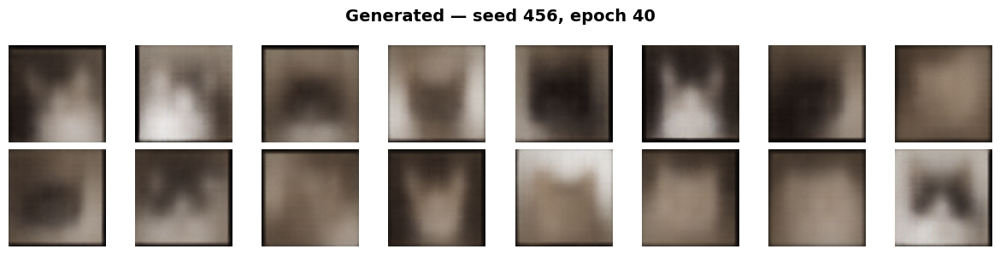

  [seed=456] Epoch [ 41/50] Loss: 0.1981 (recon=0.1514, kl=0.0467)
  [seed=456] Epoch [ 42/50] Loss: 0.1980 (recon=0.1510, kl=0.0470)
  [seed=456] Epoch [ 43/50] Loss: 0.1981 (recon=0.1513, kl=0.0468)
  [seed=456] Epoch [ 44/50] Loss: 0.1984 (recon=0.1513, kl=0.0472)
  [seed=456] Epoch [ 45/50] Loss: 0.1979 (recon=0.1511, kl=0.0467)
  [seed=456] Epoch [ 46/50] Loss: 0.1976 (recon=0.1507, kl=0.0469)
  [seed=456] Epoch [ 47/50] Loss: 0.1981 (recon=0.1512, kl=0.0468)
  [seed=456] Epoch [ 48/50] Loss: 0.1974 (recon=0.1504, kl=0.0471)
  [seed=456] Epoch [ 49/50] Loss: 0.1979 (recon=0.1509, kl=0.0471)
  [seed=456] Epoch [ 50/50] Loss: 0.1981 (recon=0.1509, kl=0.0473)


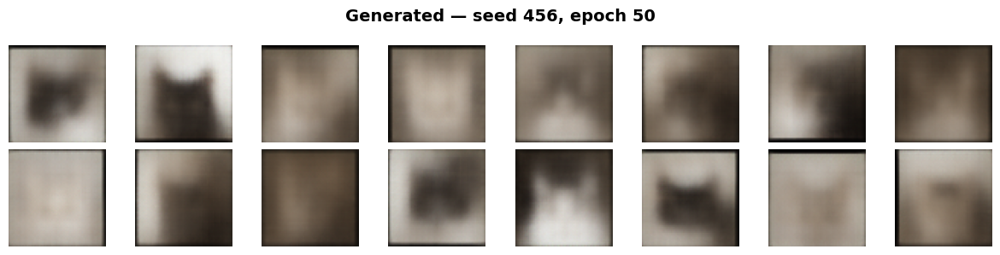

Evaluating with 1000 samples...
  Extracting real image features...


  Real:  10%|▉         | 15/156 [00:00<00:09, 15.30it/s]


  Generating fake images...
  Computing FID...
  Computing Inception Score...

EVALUATION RESULTS
FID: 267.17  (lower is better)
Inception Score: 1.39 +/- 0.02  (higher is better)

Training VAE for lr = 0.0005

-------------------------------------------------------
Training lr_=0.0005 seed=42
-------------------------------------------------------
  [seed=42] Epoch [  1/50] Loss: 0.3044 (recon=0.2724, kl=0.0319)
  [seed=42] Epoch [  2/50] Loss: 0.2387 (recon=0.2006, kl=0.0381)
  [seed=42] Epoch [  3/50] Loss: 0.2217 (recon=0.1836, kl=0.0381)
  [seed=42] Epoch [  4/50] Loss: 0.2169 (recon=0.1781, kl=0.0388)
  [seed=42] Epoch [  5/50] Loss: 0.2149 (recon=0.1754, kl=0.0395)
  [seed=42] Epoch [  6/50] Loss: 0.2128 (recon=0.1728, kl=0.0400)
  [seed=42] Epoch [  7/50] Loss: 0.2111 (recon=0.1704, kl=0.0407)
  [seed=42] Epoch [  8/50] Loss: 0.2106 (recon=0.1692, kl=0.0414)
  [seed=42] Epoch [  9/50] Loss: 0.2094 (recon=0.1675, kl=0.0419)
  [seed=42] Epoch [ 10/50] Loss: 0.2081 (recon=0.1659, 

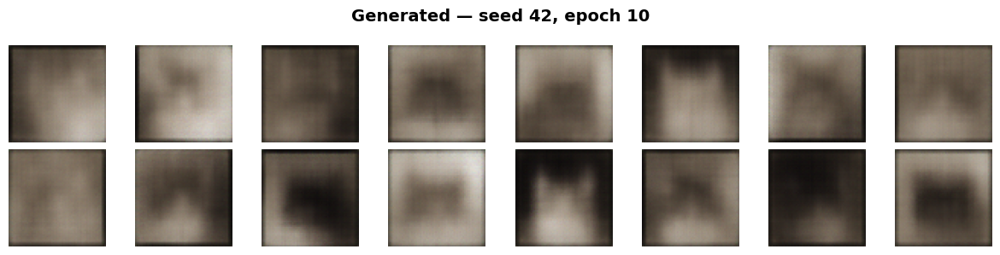

  [seed=42] Epoch [ 11/50] Loss: 0.2075 (recon=0.1646, kl=0.0428)
  [seed=42] Epoch [ 12/50] Loss: 0.2064 (recon=0.1630, kl=0.0434)
  [seed=42] Epoch [ 13/50] Loss: 0.2053 (recon=0.1619, kl=0.0434)
  [seed=42] Epoch [ 14/50] Loss: 0.2051 (recon=0.1608, kl=0.0443)
  [seed=42] Epoch [ 15/50] Loss: 0.2044 (recon=0.1600, kl=0.0444)
  [seed=42] Epoch [ 16/50] Loss: 0.2038 (recon=0.1590, kl=0.0448)
  [seed=42] Epoch [ 17/50] Loss: 0.2032 (recon=0.1579, kl=0.0453)
  [seed=42] Epoch [ 18/50] Loss: 0.2026 (recon=0.1572, kl=0.0453)
  [seed=42] Epoch [ 19/50] Loss: 0.2022 (recon=0.1563, kl=0.0459)
  [seed=42] Epoch [ 20/50] Loss: 0.2015 (recon=0.1555, kl=0.0460)


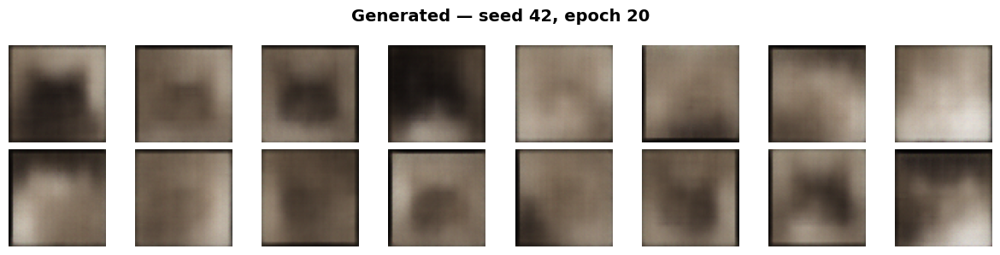

  [seed=42] Epoch [ 21/50] Loss: 0.2012 (recon=0.1550, kl=0.0462)
  [seed=42] Epoch [ 22/50] Loss: 0.2012 (recon=0.1546, kl=0.0466)
  [seed=42] Epoch [ 23/50] Loss: 0.2009 (recon=0.1542, kl=0.0467)
  [seed=42] Epoch [ 24/50] Loss: 0.2004 (recon=0.1536, kl=0.0468)
  [seed=42] Epoch [ 25/50] Loss: 0.2004 (recon=0.1539, kl=0.0465)
  [seed=42] Epoch [ 26/50] Loss: 0.2002 (recon=0.1535, kl=0.0467)
  [seed=42] Epoch [ 27/50] Loss: 0.1997 (recon=0.1533, kl=0.0464)
  [seed=42] Epoch [ 28/50] Loss: 0.1998 (recon=0.1530, kl=0.0468)
  [seed=42] Epoch [ 29/50] Loss: 0.2001 (recon=0.1533, kl=0.0468)
  [seed=42] Epoch [ 30/50] Loss: 0.2002 (recon=0.1531, kl=0.0471)


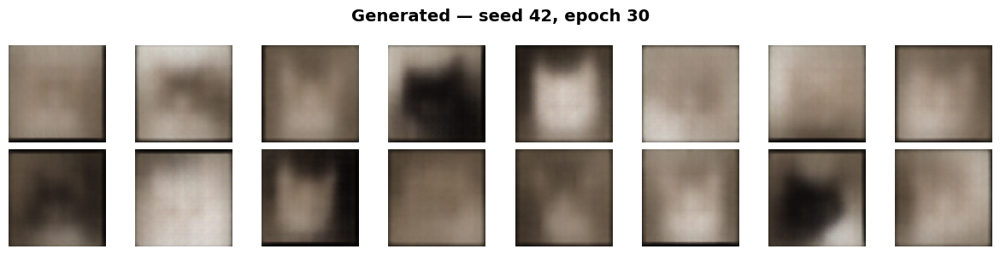

  [seed=42] Epoch [ 31/50] Loss: 0.1999 (recon=0.1532, kl=0.0467)
  [seed=42] Epoch [ 32/50] Loss: 0.1998 (recon=0.1528, kl=0.0470)
  [seed=42] Epoch [ 33/50] Loss: 0.2000 (recon=0.1530, kl=0.0470)
  [seed=42] Epoch [ 34/50] Loss: 0.1982 (recon=0.1512, kl=0.0471)
  [seed=42] Epoch [ 35/50] Loss: 0.1979 (recon=0.1510, kl=0.0469)
  [seed=42] Epoch [ 36/50] Loss: 0.1975 (recon=0.1504, kl=0.0471)
  [seed=42] Epoch [ 37/50] Loss: 0.1979 (recon=0.1509, kl=0.0470)
  [seed=42] Epoch [ 38/50] Loss: 0.1977 (recon=0.1506, kl=0.0471)
  [seed=42] Epoch [ 39/50] Loss: 0.1979 (recon=0.1509, kl=0.0470)
  [seed=42] Epoch [ 40/50] Loss: 0.1980 (recon=0.1508, kl=0.0472)


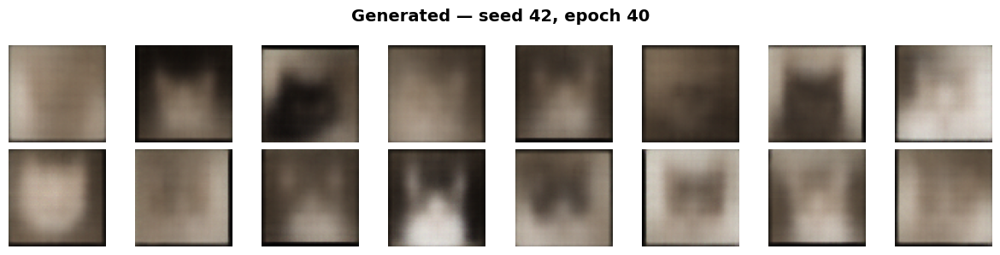

  [seed=42] Epoch [ 41/50] Loss: 0.1975 (recon=0.1505, kl=0.0470)
  [seed=42] Epoch [ 42/50] Loss: 0.1977 (recon=0.1507, kl=0.0470)
  [seed=42] Epoch [ 43/50] Loss: 0.1974 (recon=0.1503, kl=0.0470)
  [seed=42] Epoch [ 44/50] Loss: 0.1976 (recon=0.1504, kl=0.0472)
  [seed=42] Epoch [ 45/50] Loss: 0.1976 (recon=0.1503, kl=0.0473)
  [seed=42] Epoch [ 46/50] Loss: 0.1971 (recon=0.1502, kl=0.0469)
  [seed=42] Epoch [ 47/50] Loss: 0.1975 (recon=0.1503, kl=0.0471)
  [seed=42] Epoch [ 48/50] Loss: 0.1973 (recon=0.1502, kl=0.0471)
  [seed=42] Epoch [ 49/50] Loss: 0.1973 (recon=0.1500, kl=0.0473)
  [seed=42] Epoch [ 50/50] Loss: 0.1977 (recon=0.1500, kl=0.0477)


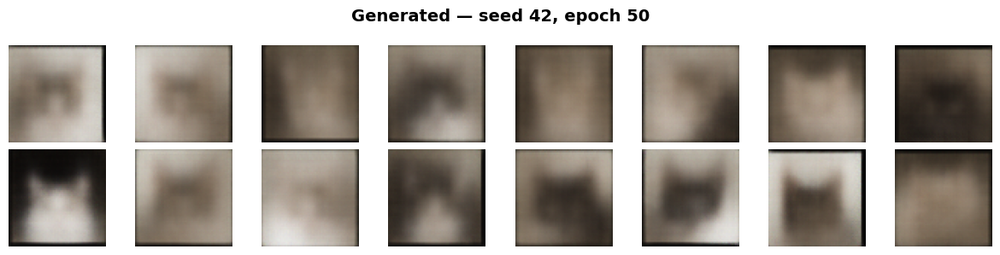

Evaluating with 1000 samples...
  Extracting real image features...


  Real:  10%|▉         | 15/156 [00:00<00:09, 15.44it/s]


  Generating fake images...
  Computing FID...
  Computing Inception Score...

EVALUATION RESULTS
FID: 267.25  (lower is better)
Inception Score: 1.38 +/- 0.04  (higher is better)

-------------------------------------------------------
Training lr_=0.0005 seed=123
-------------------------------------------------------
  [seed=123] Epoch [  1/50] Loss: 0.2869 (recon=0.2518, kl=0.0351)
  [seed=123] Epoch [  2/50] Loss: 0.2382 (recon=0.1997, kl=0.0385)
  [seed=123] Epoch [  3/50] Loss: 0.2219 (recon=0.1839, kl=0.0380)
  [seed=123] Epoch [  4/50] Loss: 0.2169 (recon=0.1781, kl=0.0388)
  [seed=123] Epoch [  5/50] Loss: 0.2141 (recon=0.1740, kl=0.0401)
  [seed=123] Epoch [  6/50] Loss: 0.2127 (recon=0.1711, kl=0.0416)
  [seed=123] Epoch [  7/50] Loss: 0.2109 (recon=0.1691, kl=0.0418)
  [seed=123] Epoch [  8/50] Loss: 0.2097 (recon=0.1676, kl=0.0421)
  [seed=123] Epoch [  9/50] Loss: 0.2094 (recon=0.1668, kl=0.0425)
  [seed=123] Epoch [ 10/50] Loss: 0.2082 (recon=0.1660, kl=0.0422)


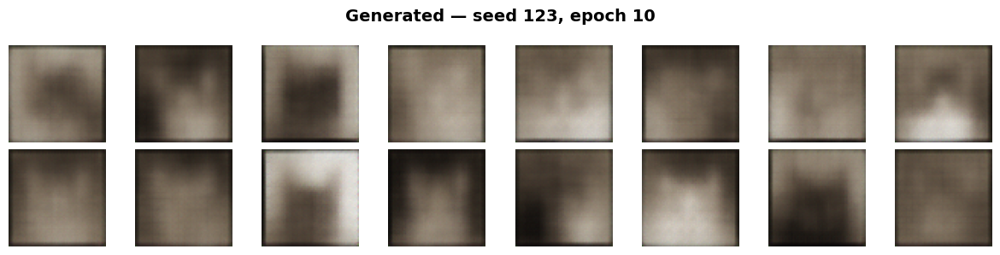

  [seed=123] Epoch [ 11/50] Loss: 0.2073 (recon=0.1646, kl=0.0427)
  [seed=123] Epoch [ 12/50] Loss: 0.2073 (recon=0.1647, kl=0.0425)
  [seed=123] Epoch [ 13/50] Loss: 0.2061 (recon=0.1634, kl=0.0427)
  [seed=123] Epoch [ 14/50] Loss: 0.2055 (recon=0.1623, kl=0.0432)
  [seed=123] Epoch [ 15/50] Loss: 0.2054 (recon=0.1620, kl=0.0434)
  [seed=123] Epoch [ 16/50] Loss: 0.2053 (recon=0.1611, kl=0.0442)
  [seed=123] Epoch [ 17/50] Loss: 0.2046 (recon=0.1612, kl=0.0434)
  [seed=123] Epoch [ 18/50] Loss: 0.2039 (recon=0.1601, kl=0.0437)
  [seed=123] Epoch [ 19/50] Loss: 0.2036 (recon=0.1597, kl=0.0438)
  [seed=123] Epoch [ 20/50] Loss: 0.2035 (recon=0.1591, kl=0.0445)


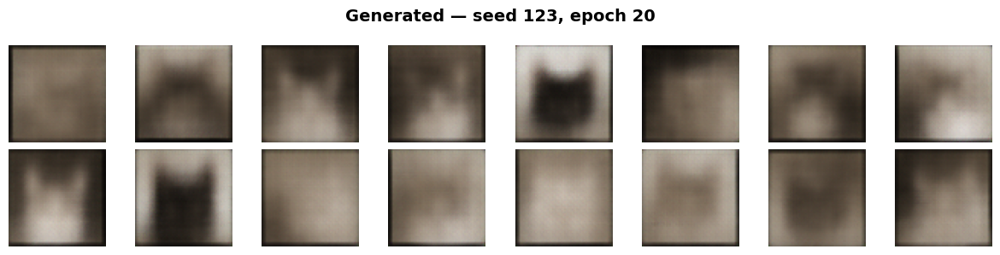

  [seed=123] Epoch [ 21/50] Loss: 0.2035 (recon=0.1590, kl=0.0445)
  [seed=123] Epoch [ 22/50] Loss: 0.2029 (recon=0.1575, kl=0.0454)
  [seed=123] Epoch [ 23/50] Loss: 0.2022 (recon=0.1563, kl=0.0459)
  [seed=123] Epoch [ 24/50] Loss: 0.2014 (recon=0.1549, kl=0.0465)
  [seed=123] Epoch [ 25/50] Loss: 0.2005 (recon=0.1543, kl=0.0463)
  [seed=123] Epoch [ 26/50] Loss: 0.2009 (recon=0.1546, kl=0.0463)
  [seed=123] Epoch [ 27/50] Loss: 0.2004 (recon=0.1539, kl=0.0465)
  [seed=123] Epoch [ 28/50] Loss: 0.2002 (recon=0.1536, kl=0.0466)
  [seed=123] Epoch [ 29/50] Loss: 0.2001 (recon=0.1533, kl=0.0468)
  [seed=123] Epoch [ 30/50] Loss: 0.1998 (recon=0.1529, kl=0.0469)


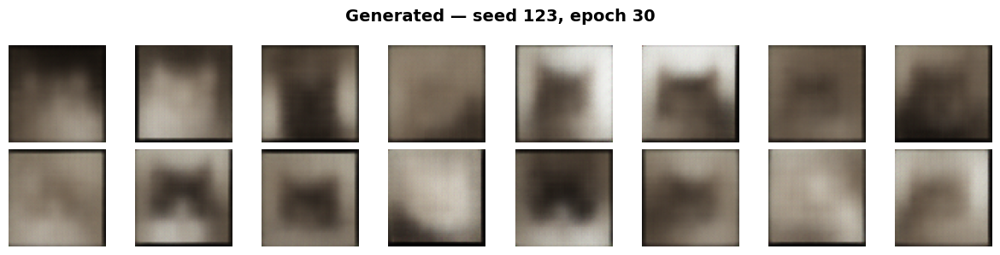

  [seed=123] Epoch [ 31/50] Loss: 0.1996 (recon=0.1528, kl=0.0468)
  [seed=123] Epoch [ 32/50] Loss: 0.1996 (recon=0.1525, kl=0.0471)
  [seed=123] Epoch [ 33/50] Loss: 0.1995 (recon=0.1529, kl=0.0467)
  [seed=123] Epoch [ 34/50] Loss: 0.1998 (recon=0.1528, kl=0.0470)
  [seed=123] Epoch [ 35/50] Loss: 0.1993 (recon=0.1523, kl=0.0470)
  [seed=123] Epoch [ 36/50] Loss: 0.1994 (recon=0.1528, kl=0.0467)
  [seed=123] Epoch [ 37/50] Loss: 0.1993 (recon=0.1524, kl=0.0469)
  [seed=123] Epoch [ 38/50] Loss: 0.1993 (recon=0.1522, kl=0.0471)
  [seed=123] Epoch [ 39/50] Loss: 0.1991 (recon=0.1520, kl=0.0471)
  [seed=123] Epoch [ 40/50] Loss: 0.1987 (recon=0.1518, kl=0.0469)


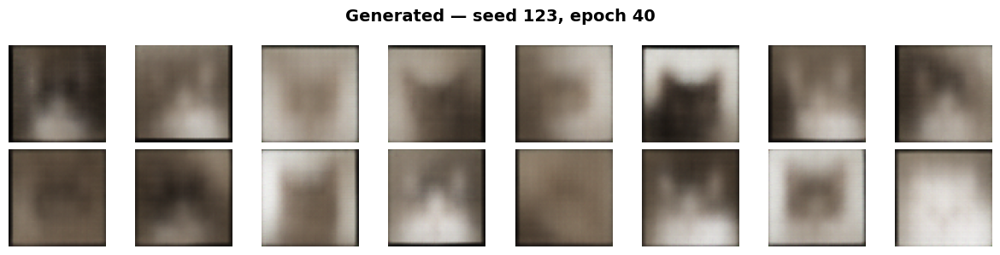

  [seed=123] Epoch [ 41/50] Loss: 0.1988 (recon=0.1519, kl=0.0469)
  [seed=123] Epoch [ 42/50] Loss: 0.1985 (recon=0.1517, kl=0.0468)
  [seed=123] Epoch [ 43/50] Loss: 0.1986 (recon=0.1518, kl=0.0469)
  [seed=123] Epoch [ 44/50] Loss: 0.1987 (recon=0.1516, kl=0.0471)
  [seed=123] Epoch [ 45/50] Loss: 0.1986 (recon=0.1515, kl=0.0471)
  [seed=123] Epoch [ 46/50] Loss: 0.1984 (recon=0.1513, kl=0.0471)
  [seed=123] Epoch [ 47/50] Loss: 0.1982 (recon=0.1514, kl=0.0468)
  [seed=123] Epoch [ 48/50] Loss: 0.1983 (recon=0.1513, kl=0.0470)
  [seed=123] Epoch [ 49/50] Loss: 0.1984 (recon=0.1512, kl=0.0472)
  [seed=123] Epoch [ 50/50] Loss: 0.1981 (recon=0.1508, kl=0.0473)


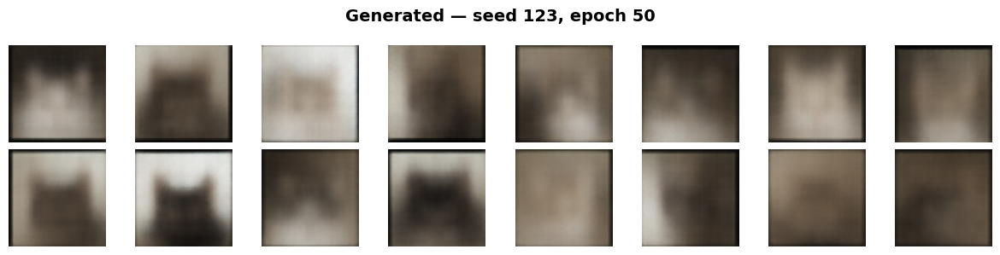

Evaluating with 1000 samples...
  Extracting real image features...


  Real:  10%|▉         | 15/156 [00:00<00:09, 15.36it/s]


  Generating fake images...
  Computing FID...
  Computing Inception Score...

EVALUATION RESULTS
FID: 267.41  (lower is better)
Inception Score: 1.37 +/- 0.03  (higher is better)

-------------------------------------------------------
Training lr_=0.0005 seed=456
-------------------------------------------------------
  [seed=456] Epoch [  1/50] Loss: 0.2948 (recon=0.2644, kl=0.0303)
  [seed=456] Epoch [  2/50] Loss: 0.2426 (recon=0.2036, kl=0.0390)
  [seed=456] Epoch [  3/50] Loss: 0.2239 (recon=0.1868, kl=0.0371)
  [seed=456] Epoch [  4/50] Loss: 0.2196 (recon=0.1816, kl=0.0380)
  [seed=456] Epoch [  5/50] Loss: 0.2158 (recon=0.1759, kl=0.0399)
  [seed=456] Epoch [  6/50] Loss: 0.2121 (recon=0.1710, kl=0.0411)
  [seed=456] Epoch [  7/50] Loss: 0.2106 (recon=0.1684, kl=0.0423)
  [seed=456] Epoch [  8/50] Loss: 0.2094 (recon=0.1666, kl=0.0427)
  [seed=456] Epoch [  9/50] Loss: 0.2087 (recon=0.1659, kl=0.0428)
  [seed=456] Epoch [ 10/50] Loss: 0.2074 (recon=0.1641, kl=0.0433)


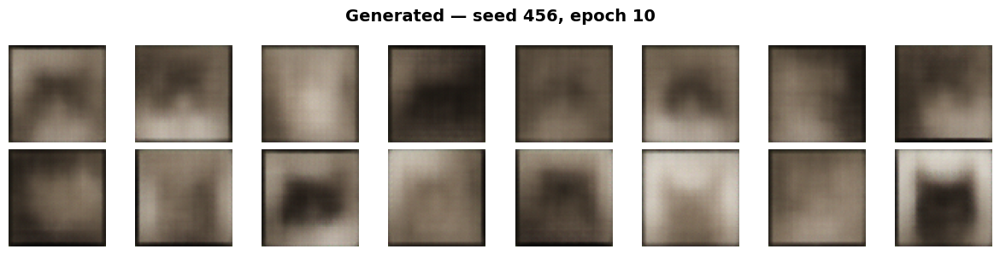

  [seed=456] Epoch [ 11/50] Loss: 0.2072 (recon=0.1636, kl=0.0436)
  [seed=456] Epoch [ 12/50] Loss: 0.2058 (recon=0.1618, kl=0.0440)
  [seed=456] Epoch [ 13/50] Loss: 0.2057 (recon=0.1611, kl=0.0446)
  [seed=456] Epoch [ 14/50] Loss: 0.2049 (recon=0.1601, kl=0.0448)
  [seed=456] Epoch [ 15/50] Loss: 0.2043 (recon=0.1594, kl=0.0450)
  [seed=456] Epoch [ 16/50] Loss: 0.2040 (recon=0.1586, kl=0.0454)
  [seed=456] Epoch [ 17/50] Loss: 0.2032 (recon=0.1574, kl=0.0458)
  [seed=456] Epoch [ 18/50] Loss: 0.2029 (recon=0.1575, kl=0.0454)
  [seed=456] Epoch [ 19/50] Loss: 0.2027 (recon=0.1570, kl=0.0458)
  [seed=456] Epoch [ 20/50] Loss: 0.2026 (recon=0.1568, kl=0.0458)


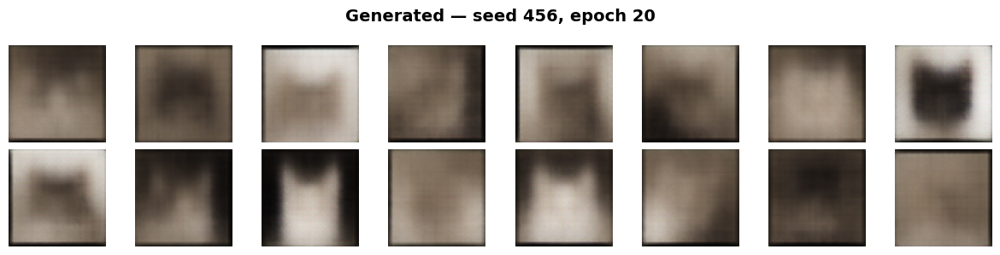

  [seed=456] Epoch [ 21/50] Loss: 0.2018 (recon=0.1560, kl=0.0459)
  [seed=456] Epoch [ 22/50] Loss: 0.2021 (recon=0.1561, kl=0.0460)
  [seed=456] Epoch [ 23/50] Loss: 0.2015 (recon=0.1558, kl=0.0458)
  [seed=456] Epoch [ 24/50] Loss: 0.2015 (recon=0.1555, kl=0.0460)
  [seed=456] Epoch [ 25/50] Loss: 0.2011 (recon=0.1550, kl=0.0461)
  [seed=456] Epoch [ 26/50] Loss: 0.2007 (recon=0.1543, kl=0.0464)
  [seed=456] Epoch [ 27/50] Loss: 0.2004 (recon=0.1542, kl=0.0463)
  [seed=456] Epoch [ 28/50] Loss: 0.1998 (recon=0.1536, kl=0.0462)
  [seed=456] Epoch [ 29/50] Loss: 0.2000 (recon=0.1534, kl=0.0466)
  [seed=456] Epoch [ 30/50] Loss: 0.1999 (recon=0.1530, kl=0.0469)


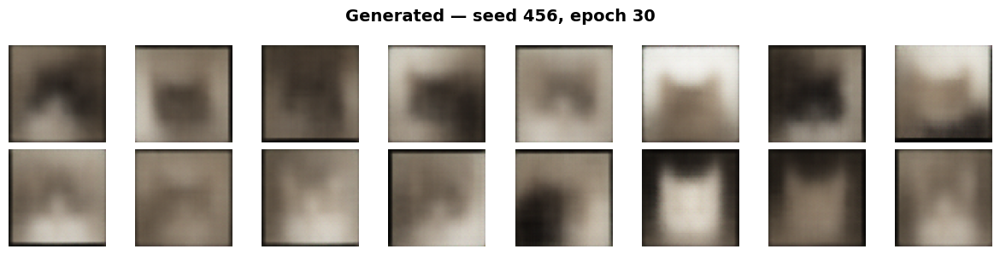

  [seed=456] Epoch [ 31/50] Loss: 0.1995 (recon=0.1530, kl=0.0465)
  [seed=456] Epoch [ 32/50] Loss: 0.1997 (recon=0.1529, kl=0.0468)
  [seed=456] Epoch [ 33/50] Loss: 0.1996 (recon=0.1532, kl=0.0464)
  [seed=456] Epoch [ 34/50] Loss: 0.1995 (recon=0.1527, kl=0.0468)
  [seed=456] Epoch [ 35/50] Loss: 0.1988 (recon=0.1522, kl=0.0467)
  [seed=456] Epoch [ 36/50] Loss: 0.1992 (recon=0.1523, kl=0.0469)
  [seed=456] Epoch [ 37/50] Loss: 0.1989 (recon=0.1522, kl=0.0467)
  [seed=456] Epoch [ 38/50] Loss: 0.1993 (recon=0.1521, kl=0.0472)
  [seed=456] Epoch [ 39/50] Loss: 0.1988 (recon=0.1517, kl=0.0470)
  [seed=456] Epoch [ 40/50] Loss: 0.1990 (recon=0.1519, kl=0.0471)


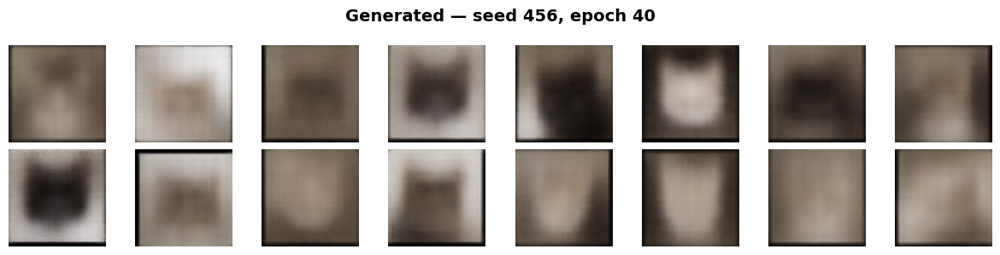

  [seed=456] Epoch [ 41/50] Loss: 0.1991 (recon=0.1520, kl=0.0470)
  [seed=456] Epoch [ 42/50] Loss: 0.1985 (recon=0.1514, kl=0.0470)
  [seed=456] Epoch [ 43/50] Loss: 0.1988 (recon=0.1518, kl=0.0470)
  [seed=456] Epoch [ 44/50] Loss: 0.1985 (recon=0.1516, kl=0.0468)
  [seed=456] Epoch [ 45/50] Loss: 0.1984 (recon=0.1515, kl=0.0469)
  [seed=456] Epoch [ 46/50] Loss: 0.1982 (recon=0.1511, kl=0.0470)
  [seed=456] Epoch [ 47/50] Loss: 0.1985 (recon=0.1514, kl=0.0471)
  [seed=456] Epoch [ 48/50] Loss: 0.1978 (recon=0.1509, kl=0.0469)
  [seed=456] Epoch [ 49/50] Loss: 0.1983 (recon=0.1512, kl=0.0471)
  [seed=456] Epoch [ 50/50] Loss: 0.1983 (recon=0.1512, kl=0.0472)


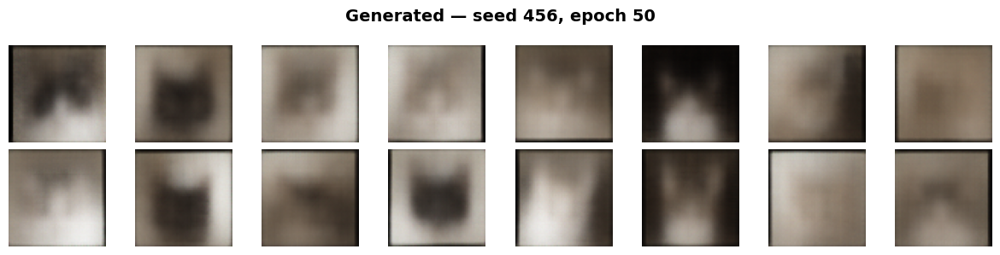

Evaluating with 1000 samples...
  Extracting real image features...


  Real:  10%|▉         | 15/156 [00:01<00:09, 14.72it/s]


  Generating fake images...
  Computing FID...
  Computing Inception Score...

EVALUATION RESULTS
FID: 267.53  (lower is better)
Inception Score: 1.41 +/- 0.04  (higher is better)


In [22]:
lr_results, lr_models = experiment_train_learning_rate(config=CONFIG)

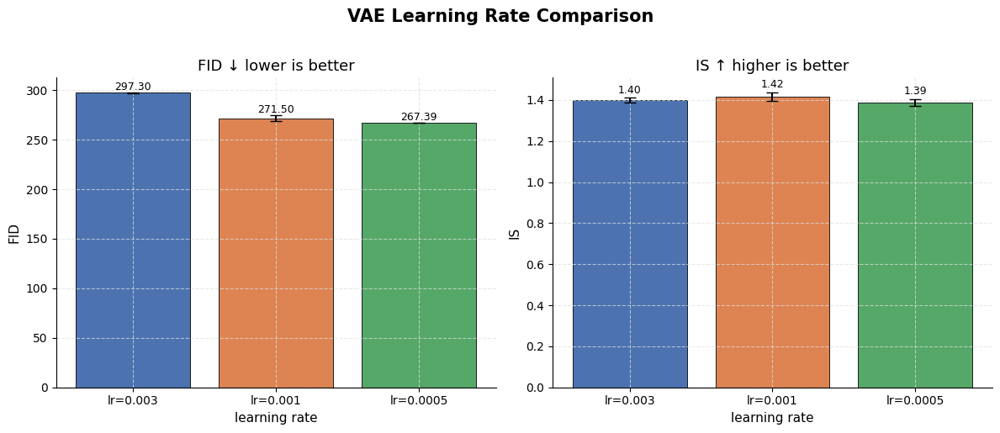

In [23]:
plot_hyperparam_comparison(
    results_dict={
        f"lr={lr}": list(seed_results.values())
        for lr, seed_results in lr_results.items()
    },
    param_name="learning rate",
    title="VAE Learning Rate Comparison",
    save_path=f"{CONFIG['checkpoint_dir']}/vae_lr_comparison.png"
)

In [24]:
print_summary_table({
    f"lr={lr}": list(seed_results.values())
    for lr, seed_results in lr_results.items()
})


Model               FID               IS
------------------------------------------
lr=0.003   297.30 ± 0.46   1.40 ± 0.01
lr=0.001   271.50 ± 3.07   1.42 ± 0.02
lr=0.0005  267.39 ± 0.11   1.39 ± 0.02



In [25]:
import pandas as pd

summary_rows = []

for lr, seed_results in lr_results.items():
    results = list(seed_results.values())

    summary_rows.append({
        "lr": lr,
        "FID mean": np.mean([r["fid"] for r in results]),
        "FID std": np.std([r["fid"] for r in results]),
        "IS mean": np.mean([r["is_mean"] for r in results]),
        "IS std": np.std([r["is_mean"] for r in results]),
    })

lr_summary_df = pd.DataFrame(summary_rows)
lr_summary_df = lr_summary_df.sort_values("FID mean")

lr_summary_df

,lr,FID mean,FID std,IS mean,IS std
2,0.0005,267.394422,0.112436,1.386569,0.017773
1,0.0010,271.497716,3.066776,1.416117,0.020712
0,0.0030,297.296811,0.457418,1.398601,0.012425


In [26]:
lr_summary_df.to_csv("/kaggle/working/vae_outputs/vae_lr_summary.csv", index=False)

### Loss curves for the best learning rate

In [27]:
best_lr = min(
    lr_results,
    key=lambda lr: np.mean([r["fid"] for r in lr_results[lr].values()])
)

print(f"Best learning rate: lr={best_lr}")

Best learning rate: lr=0.0005


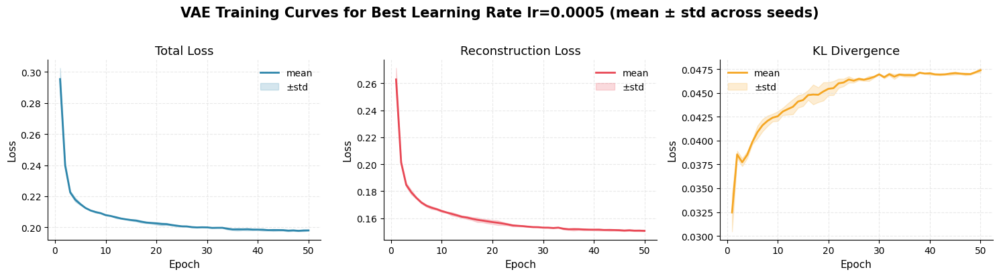

In [28]:
best_lr_results = lr_results[best_lr]

plot_loss_curves_multiseed(
    best_lr_results,
    loss_keys=("total", "recon", "kl"),
    loss_labels=("Total Loss", "Reconstruction Loss", "KL Divergence"),
    title=f"VAE Training Curves for Best Learning Rate lr={best_lr} (mean ± std across seeds)",
    save_path=f"{CONFIG['checkpoint_dir']}/vae_best_lr_loss_curves.png"
)

Best learning rate : 0.0005
Best seed          : 42
FID                : 267.25
Inception Score    : 1.38


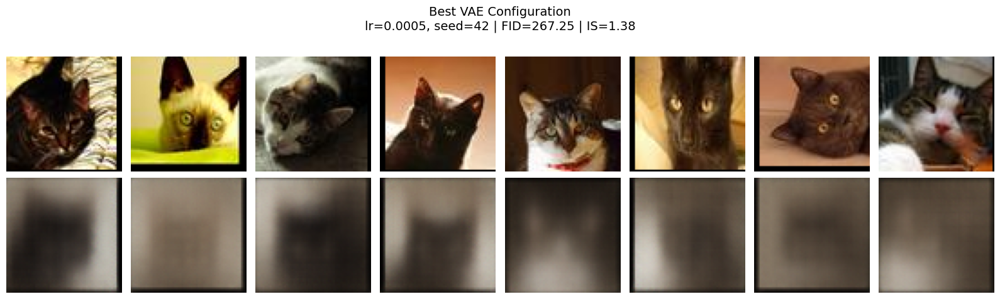

In [31]:
# reconstruction of images for best lr and best seed for it

best_seed = min(
    lr_results[best_lr],
    key=lambda s: lr_results[best_lr][s]["fid"]
)

best_fid = lr_results[best_lr][best_seed]["fid"]
best_is = lr_results[best_lr][best_seed]["is_mean"]

print(f"Best learning rate : {best_lr}")
print(f"Best seed          : {best_seed}")
print(f"FID                : {best_fid:.2f}")
print(f"Inception Score    : {best_is:.2f}")

model = lr_models[best_lr][best_seed]
model.eval()

with torch.no_grad():
    test_batch = next(iter(loader))[:8].to(device)
    recon, _, _ = model(test_batch)

originals = denormalize(test_batch.cpu()).permute(0, 2, 3, 1).numpy()
reconstructed = denormalize(recon.cpu()).permute(0, 2, 3, 1).numpy()

fig, axes = plt.subplots(2, 8, figsize=(16, 5))

for i in range(8):
    axes[0, i].imshow(originals[i].clip(0, 1))
    axes[0, i].axis("off")

    axes[1, i].imshow(reconstructed[i].clip(0, 1))
    axes[1, i].axis("off")

axes[0, 0].set_ylabel("Original", fontsize=12)
axes[1, 0].set_ylabel("Reconstructed", fontsize=12)

plt.suptitle(
    f"Best VAE Configuration\n"
    f"lr={best_lr}, seed={best_seed} | "
    f"FID={best_fid:.2f} | IS={best_is:.2f}",
    fontsize=14
)

plt.tight_layout()

plt.savefig(
    f"{CONFIG['checkpoint_dir']}/best_lr_reconstructions.png",
    dpi=100,
    bbox_inches="tight"
)

plt.show()